In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached pyro_ppl-1.9.1-py3-none-any.whl (755 kB)
  Using cached pyro_api-0.1.2-py3-none-any.whl (11 kB)


In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1292, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 1292 (delta 36), reused 43 (delta 21), pack-reused 1227
Receiving objects: 100% (1292/1292), 57.45 MiB | 15.38 MiB/s, done.
Resolving deltas: 100% (920/920), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_SkewedPrior import make_lm_program_gamma_prior, make_lm_program_gamma_prior_batched

from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
make_lm_program = make_lm_program_gamma_prior
make_lm_program_batched= make_lm_program_gamma_prior_batched

N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaGammPrior_LearnedBaseDist_plus_nll_v1"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0
alpha = 0.5

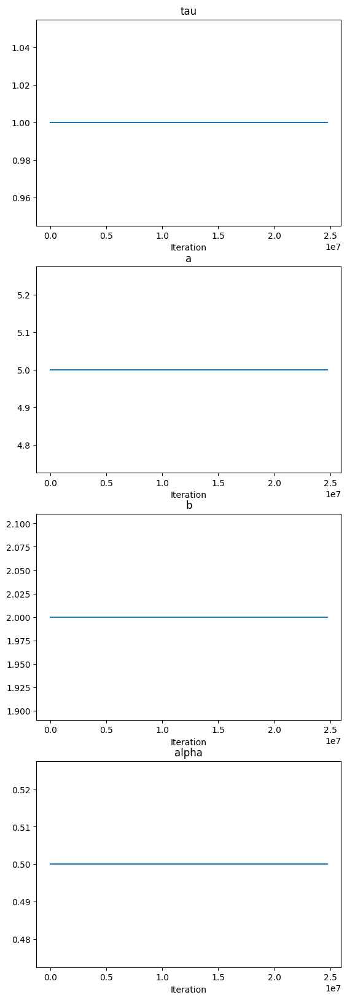

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("alpha", curriculum.constant_scheduler(alpha))

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_batched,
    curriculum= curriculum,
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 12.52it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.5001), 'variance': tensor(0.0833), 'min': tensor(1.8477e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2567), 'variance': tensor(1.2670), 'min': tensor(-8.7648), 'max': tensor(12.8754)}, 'beta': {'mean': tensor([0.5183, 0.5093, 0.4980, 0.4921, 0.4974]), 'variance': tensor([0.5429, 0.5267, 0.4966, 0.4887, 0.5050]), 'min': tensor([1.2164e-07, 6.6745e-07, 1.7026e-07, 1.7607e-09, 1.5259e-09]), 'max': tensor([6.6278, 5.9371, 6.1724, 5.8521, 7.6868])}}
Statistics for sigma_squared:
Mean: tensor([0.4846])
Variance: tensor([0.0721])
Min: tensor([0.1250])
Max: tensor([3.8563])


Statistics for time:
Mean: 0.5067028982797638
Variance: 0.08423617825997458
Min: 0.00015562772750854492
Max: 0.9995942711830139


Statistics for base_sample_beta:
Mean: tensor([ 0.0298, -0.0308, -0.0019, -0.0031,  0.0064])
Variance: tensor([0.9619, 1.0229, 1.0109, 0.9849, 1.0807])
Min: tensor([-4.0617, -3.4375, -3.5881, -3.0510, -3.4877])
Max: tensor([3.7319, 4.1839, 

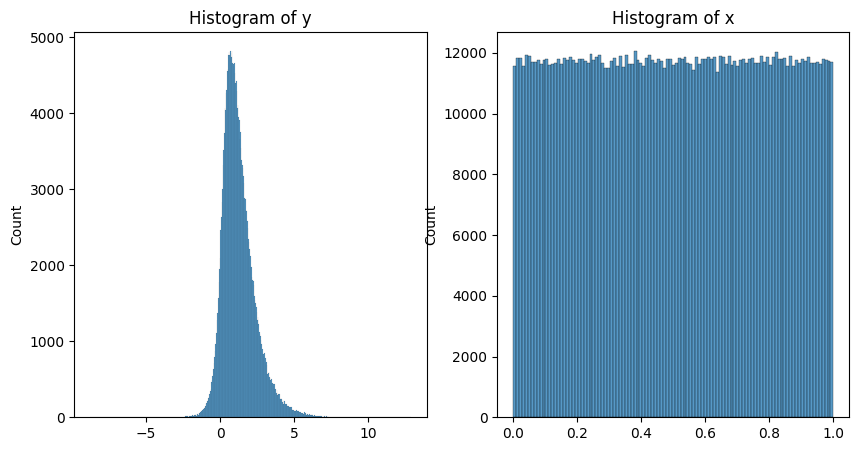

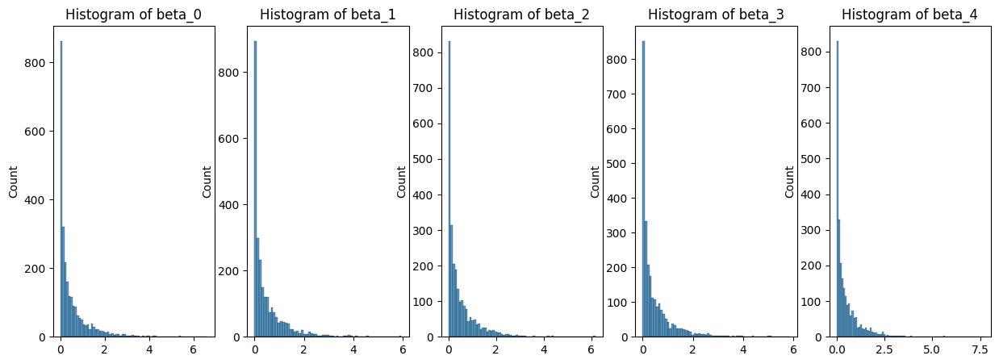

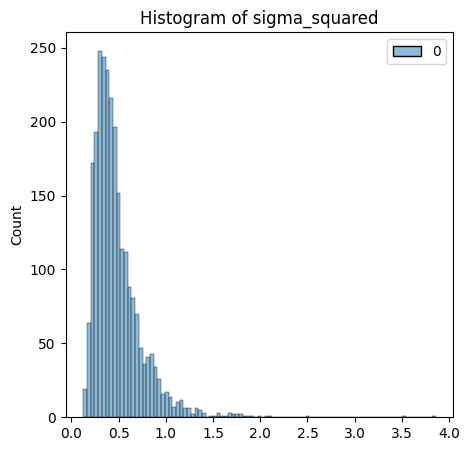

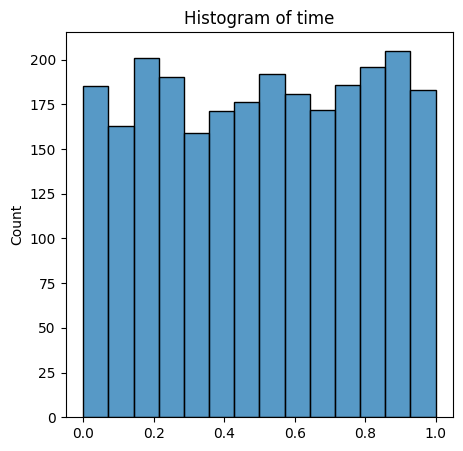

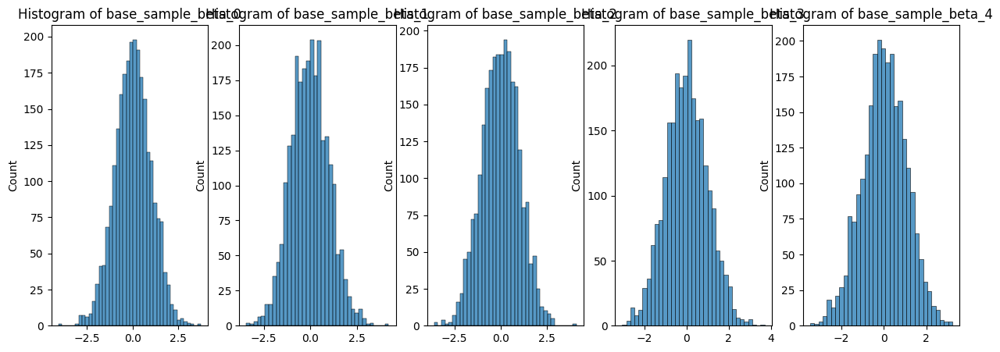

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 76.64it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.4997), 'variance': tensor(0.0834), 'min': tensor(2.9802e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2480), 'variance': tensor(1.2446), 'min': tensor(-7.7262), 'max': tensor(9.9057)}, 'beta': {'mean': tensor([0.4720, 0.5149, 0.4977, 0.4908, 0.5213]), 'variance': tensor([0.4102, 0.5019, 0.4772, 0.4902, 0.5504]), 'min': tensor([9.5217e-09, 1.8101e-09, 3.4793e-08, 2.1950e-07, 6.9379e-09]), 'max': tensor([4.8304, 6.1911, 7.2898, 5.9444, 6.3100])}}
Statistics for sigma_squared:
Mean: tensor([0.4995])
Variance: tensor([0.0726])
Min: tensor([0.1143])
Max: tensor([2.6932])


Statistics for time:
Mean: 0.5093357676872984
Variance: 0.08297258339664275
Min: 0.0002104640007019043
Max: 0.9998382925987244


Statistics for base_sample_beta:
Mean: tensor([-0.0034, -0.0304,  0.0312, -0.0246,  0.0225])
Variance: tensor([1.0098, 0.9784, 1.0205, 1.0057, 0.9797])
Min: tensor([-3.6941, -3.7554, -3.3058, -3.2833, -3.3064])
Max: tensor([2.9507, 3.6294, 3.

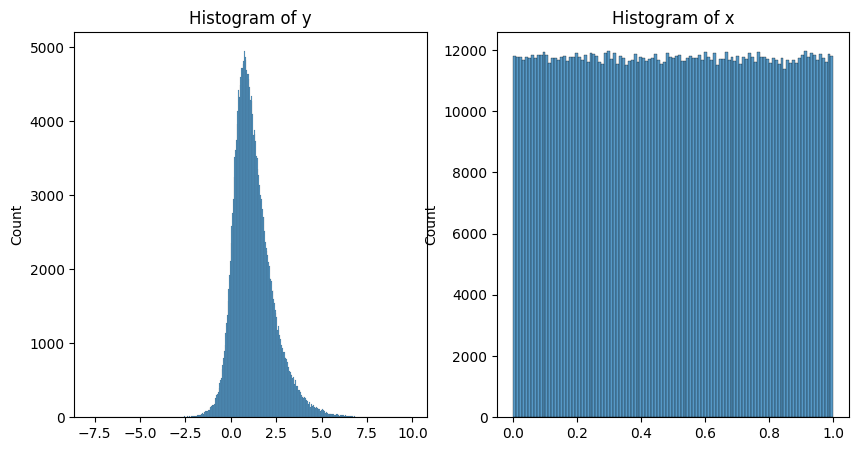

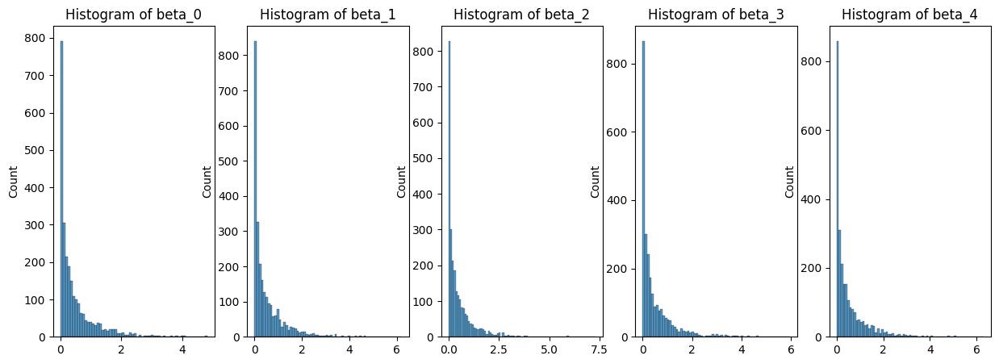

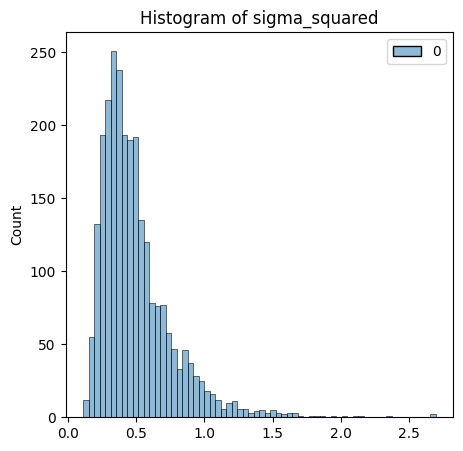

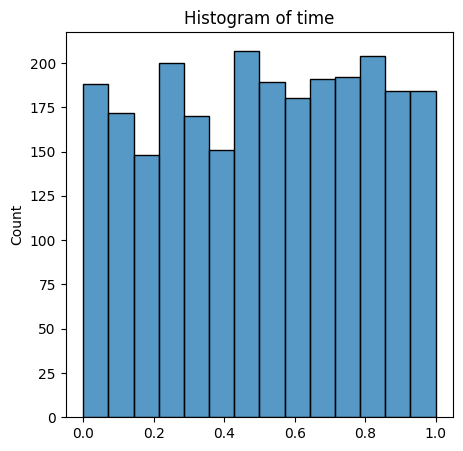

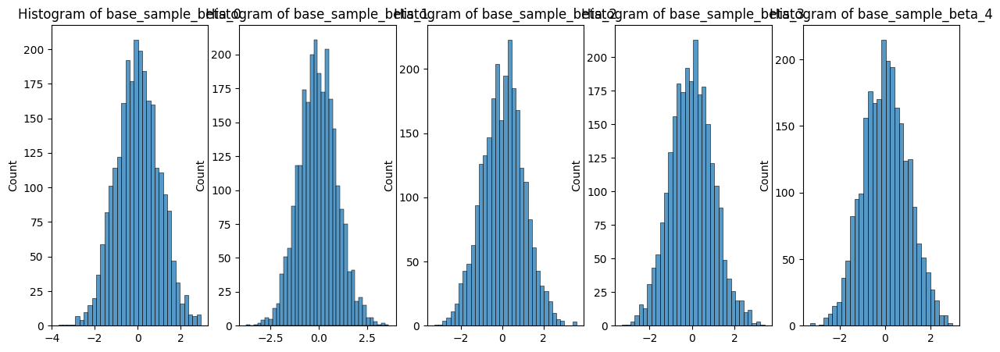

[{'X': {'mean': tensor(0.5001),
   'variance': tensor(0.0833),
   'min': tensor(1.8477e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2567),
   'variance': tensor(1.2670),
   'min': tensor(-8.7648),
   'max': tensor(12.8754)},
  'beta': {'mean': tensor([0.5183, 0.5093, 0.4980, 0.4921, 0.4974]),
   'variance': tensor([0.5429, 0.5267, 0.4966, 0.4887, 0.5050]),
   'min': tensor([1.2164e-07, 6.6745e-07, 1.7026e-07, 1.7607e-09, 1.5259e-09]),
   'max': tensor([6.6278, 5.9371, 6.1724, 5.8521, 7.6868])}},
 {'X': {'mean': tensor(0.4997),
   'variance': tensor(0.0834),
   'min': tensor(2.9802e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2480),
   'variance': tensor(1.2446),
   'min': tensor(-7.7262),
   'max': tensor(9.9057)},
  'beta': {'mean': tensor([0.4720, 0.5149, 0.4977, 0.4908, 0.5213]),
   'variance': tensor([0.4102, 0.5019, 0.4772, 0.4902, 0.5504]),
   'min': tensor([9.5217e-09, 1.8101e-09, 3.4793e-08, 2.1950e-07, 6.9379e-09]),
   'max': tensor([4.8304, 6.1911, 7

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

torch.Size([1, 10])
(1, 10)


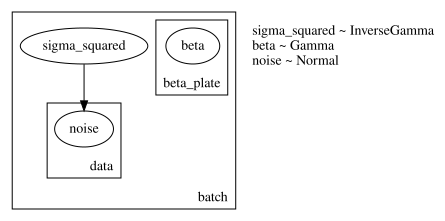

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)




/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-4,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = True
)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_19_03_15'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

Could not load model
[Errno 2] No such file or directory: '/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_19_03_15/model.pth'


In [ ]:
trainer.validate()

  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:28<00:00,  1.72it/s]


{'loss_mean': 112.85968017578125,
 'loss_median': 113.65161895751953,
 'loss_std': 4.700927734375,
 'loss_FM_mean': 0.8714702129364014,
 'loss_FM_median': 0.8724285364151001,
 'loss_FM_std': 0.021085241809487343,
 'loss_NLL_mean': 224.847900390625,
 'loss_NLL_median': 226.43997192382812,
 'loss_NLL_std': 9.392477035522461}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 0:
Training: {'loss_mean': 9.899620056152344, 'loss_median': 9.899430274963379, 'loss_std': 0.7072833180427551, 'loss_FM_mean': 3.1995935440063477, 'loss_FM_median': 3.233402967453003, 'loss_FM_std': 0.33004412055015564, 'loss_NLL_mean': 16.599647521972656, 'loss_NLL_median': 16.477861404418945, 'loss_NLL_std': 1.146249532699585}
Validation: {'loss_mean': 6.754385948181152, 'loss_median': 6.570898532867432, 'loss_std': 1.3263664245605469, 'loss_FM_mean': 1.7674891948699951, 'loss_FM_median': 1.3880693912506104, 'loss_FM_std': 2.669567823410034, 'loss_NLL_mean': 11.741281509399414, 'loss_NLL_median': 11.733072280883789, 'loss_NLL_std': 0.18250808119773865}
Validation curriculum: {'loss_mean': 6.892579555511475, 'loss_median': 6.540249347686768, 'loss_std': 2.1739540100097656, 'loss_FM_mean': 2.0623393058776855, 'loss_FM_median': 1.3741177320480347, 'loss_FM_std': 4.3282999992370605, 'loss_NLL_mean': 11.722820281982422, 'loss_NLL_median': 11.729158401489258, 'loss_NLL_std': 0.15048

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 1:
Training: {'loss_mean': 8.264192581176758, 'loss_median': 8.2586030960083, 'loss_std': 0.3070567548274994, 'loss_FM_mean': 3.06712007522583, 'loss_FM_median': 2.9801604747772217, 'loss_FM_std': 0.380119264125824, 'loss_NLL_mean': 13.461264610290527, 'loss_NLL_median': 13.517877578735352, 'loss_NLL_std': 0.8709981441497803}
Validation: {'loss_mean': 10.020698547363281, 'loss_median': 6.652531623840332, 'loss_std': 19.94982147216797, 'loss_FM_mean': 10.088096618652344, 'loss_FM_median': 3.3897864818573, 'loss_FM_std': 39.88262939453125, 'loss_NLL_mean': 9.953300476074219, 'loss_NLL_median': 9.949907302856445, 'loss_NLL_std': 0.17952118813991547}
Validation curriculum: {'loss_mean': 7.516226768493652, 'loss_median': 6.622519016265869, 'loss_std': 3.7972850799560547, 'loss_FM_mean': 5.056495189666748, 'loss_FM_median': 3.3740196228027344, 'loss_FM_std': 7.581583499908447, 'loss_NLL_mean': 9.975958824157715, 'loss_NLL_median': 9.94605541229248, 'loss_NLL_std': 0.20315216481685638}


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.83it/s]


Epoch 2:
Training: {'loss_mean': 7.832651615142822, 'loss_median': 7.794431686401367, 'loss_std': 0.36679595708847046, 'loss_FM_mean': 5.414651393890381, 'loss_FM_median': 5.254183292388916, 'loss_FM_std': 1.1838278770446777, 'loss_NLL_mean': 10.250651359558105, 'loss_NLL_median': 10.353776931762695, 'loss_NLL_std': 1.000999927520752}
Validation: {'loss_mean': 7.211642742156982, 'loss_median': 7.097300052642822, 'loss_std': 1.1495060920715332, 'loss_FM_mean': 7.252544403076172, 'loss_FM_median': 6.887784004211426, 'loss_FM_std': 2.1814489364624023, 'loss_NLL_mean': 7.170740127563477, 'loss_NLL_median': 7.139469146728516, 'loss_NLL_std': 0.20428027212619781}
Validation curriculum: {'loss_mean': 7.117615222930908, 'loss_median': 6.921059608459473, 'loss_std': 0.9130941033363342, 'loss_FM_mean': 7.015094757080078, 'loss_FM_median': 6.694602966308594, 'loss_FM_std': 1.7337669134140015, 'loss_NLL_mean': 7.220135688781738, 'loss_NLL_median': 7.208966255187988, 'loss_NLL_std': 0.2335059046745

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 3:
Training: {'loss_mean': 7.335900783538818, 'loss_median': 7.321475505828857, 'loss_std': 0.6871749758720398, 'loss_FM_mean': 8.406373023986816, 'loss_FM_median': 8.297730445861816, 'loss_FM_std': 1.4581694602966309, 'loss_NLL_mean': 6.2654290199279785, 'loss_NLL_median': 6.311216831207275, 'loss_NLL_std': 1.1289008855819702}
Validation: {'loss_mean': 6.752063751220703, 'loss_median': 6.715941429138184, 'loss_std': 1.6053118705749512, 'loss_FM_mean': 11.11946964263916, 'loss_FM_median': 11.109437942504883, 'loss_FM_std': 3.0578677654266357, 'loss_NLL_mean': 2.3846588134765625, 'loss_NLL_median': 2.383780002593994, 'loss_NLL_std': 0.26578620076179504}
Validation curriculum: {'loss_mean': 6.6513285636901855, 'loss_median': 6.797618865966797, 'loss_std': 1.878562569618225, 'loss_FM_mean': 10.893583297729492, 'loss_FM_median': 11.34908676147461, 'loss_FM_std': 3.61021089553833, 'loss_NLL_mean': 2.409074068069458, 'loss_NLL_median': 2.4179325103759766, 'loss_NLL_std': 0.248955443501

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 4:
Training: {'loss_mean': 7.095364093780518, 'loss_median': 7.016214370727539, 'loss_std': 0.886192262172699, 'loss_FM_mean': 10.902189254760742, 'loss_FM_median': 10.815295219421387, 'loss_FM_std': 1.7595680952072144, 'loss_NLL_mean': 3.2885375022888184, 'loss_NLL_median': 3.180305004119873, 'loss_NLL_std': 0.7940093278884888}
Validation: {'loss_mean': 8.809101104736328, 'loss_median': 9.00484848022461, 'loss_std': 2.0635299682617188, 'loss_FM_mean': 17.237600326538086, 'loss_FM_median': 17.195459365844727, 'loss_FM_std': 4.011557579040527, 'loss_NLL_mean': 0.38059917092323303, 'loss_NLL_median': 0.3270324468612671, 'loss_NLL_std': 0.2540734112262726}
Validation curriculum: {'loss_mean': 8.282818794250488, 'loss_median': 8.441068649291992, 'loss_std': 2.304922580718994, 'loss_FM_mean': 16.227012634277344, 'loss_FM_median': 16.391666412353516, 'loss_FM_std': 4.507399559020996, 'loss_NLL_mean': 0.33862507343292236, 'loss_NLL_median': 0.3286018371582031, 'loss_NLL_std': 0.20613475

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 5:
Training: {'loss_mean': 6.844447135925293, 'loss_median': 6.697551727294922, 'loss_std': 1.1562714576721191, 'loss_FM_mean': 11.878849029541016, 'loss_FM_median': 11.81208610534668, 'loss_FM_std': 2.1214168071746826, 'loss_NLL_mean': 1.8100444078445435, 'loss_NLL_median': 1.6196949481964111, 'loss_NLL_std': 0.8832465410232544}
Validation: {'loss_mean': 8.651226997375488, 'loss_median': 8.459540367126465, 'loss_std': 2.0172789096832275, 'loss_FM_mean': 15.836532592773438, 'loss_FM_median': 15.42625904083252, 'loss_FM_std': 3.9315311908721924, 'loss_NLL_mean': 1.4659215211868286, 'loss_NLL_median': 1.4441453218460083, 'loss_NLL_std': 0.23260368406772614}
Validation curriculum: {'loss_mean': 9.702679634094238, 'loss_median': 9.763662338256836, 'loss_std': 3.127807140350342, 'loss_FM_mean': 17.869762420654297, 'loss_FM_median': 18.191434860229492, 'loss_FM_std': 6.12006139755249, 'loss_NLL_mean': 1.5355976819992065, 'loss_NLL_median': 1.4881060123443604, 'loss_NLL_std': 0.24367682

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 6:
Training: {'loss_mean': 5.54013729095459, 'loss_median': 5.403012752532959, 'loss_std': 1.5175851583480835, 'loss_FM_mean': 9.8436279296875, 'loss_FM_median': 9.575807571411133, 'loss_FM_std': 2.9203550815582275, 'loss_NLL_mean': 1.2366456985473633, 'loss_NLL_median': 0.9458999037742615, 'loss_NLL_std': 1.1093039512634277}
Validation: {'loss_mean': 7.038336753845215, 'loss_median': 6.075807094573975, 'loss_std': 3.3252029418945312, 'loss_FM_mean': 14.656623840332031, 'loss_FM_median': 12.615859031677246, 'loss_FM_std': 6.500795364379883, 'loss_NLL_mean': -0.5799509286880493, 'loss_NLL_median': -0.6544421911239624, 'loss_NLL_std': 0.24072211980819702}
Validation curriculum: {'loss_mean': 5.640431880950928, 'loss_median': 5.637614727020264, 'loss_std': 2.3487064838409424, 'loss_FM_mean': 11.922562599182129, 'loss_FM_median': 12.040264129638672, 'loss_FM_std': 4.600111484527588, 'loss_NLL_mean': -0.641697883605957, 'loss_NLL_median': -0.6585676074028015, 'loss_NLL_std': 0.1882013

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 7:
Training: {'loss_mean': 4.305604457855225, 'loss_median': 4.101041316986084, 'loss_std': 1.4881592988967896, 'loss_FM_mean': 7.989008903503418, 'loss_FM_median': 7.579939365386963, 'loss_FM_std': 2.7162115573883057, 'loss_NLL_mean': 0.6222003698348999, 'loss_NLL_median': 0.4001575708389282, 'loss_NLL_std': 0.8522309064865112}
Validation: {'loss_mean': 4.234073638916016, 'loss_median': 3.9018232822418213, 'loss_std': 1.7766821384429932, 'loss_FM_mean': 9.509775161743164, 'loss_FM_median': 8.808417320251465, 'loss_FM_std': 3.423630714416504, 'loss_NLL_mean': -1.0416275262832642, 'loss_NLL_median': -1.078075885772705, 'loss_NLL_std': 0.20448200404644012}
Validation curriculum: {'loss_mean': 3.7272491455078125, 'loss_median': 3.263925790786743, 'loss_std': 1.8045456409454346, 'loss_FM_mean': 8.564000129699707, 'loss_FM_median': 7.812725067138672, 'loss_FM_std': 3.5263986587524414, 'loss_NLL_mean': -1.109500765800476, 'loss_NLL_median': -1.1148847341537476, 'loss_NLL_std': 0.170853

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 8:
Training: {'loss_mean': 3.5854849815368652, 'loss_median': 3.3015408515930176, 'loss_std': 1.3851380348205566, 'loss_FM_mean': 6.801133632659912, 'loss_FM_median': 6.204942226409912, 'loss_FM_std': 2.5449154376983643, 'loss_NLL_mean': 0.36983588337898254, 'loss_NLL_median': 0.10829945653676987, 'loss_NLL_std': 0.9665173292160034}
Validation: {'loss_mean': 5.88008975982666, 'loss_median': 5.593570709228516, 'loss_std': 2.4093353748321533, 'loss_FM_mean': 12.678311347961426, 'loss_FM_median': 11.987821578979492, 'loss_FM_std': 4.677470684051514, 'loss_NLL_mean': -0.9181322455406189, 'loss_NLL_median': -0.8938134908676147, 'loss_NLL_std': 0.2381051480770111}
Validation curriculum: {'loss_mean': 5.835986614227295, 'loss_median': 5.384437561035156, 'loss_std': 2.089968681335449, 'loss_FM_mean': 12.583231925964355, 'loss_FM_median': 11.571806907653809, 'loss_FM_std': 4.041691303253174, 'loss_NLL_mean': -0.9112591743469238, 'loss_NLL_median': -0.9767552018165588, 'loss_NLL_std': 0.23

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 9:
Training: {'loss_mean': 2.661090850830078, 'loss_median': 2.459218740463257, 'loss_std': 0.9982485175132751, 'loss_FM_mean': 5.3673787117004395, 'loss_FM_median': 4.927750587463379, 'loss_FM_std': 1.8248239755630493, 'loss_NLL_mean': -0.04519689828157425, 'loss_NLL_median': -0.23211073875427246, 'loss_NLL_std': 0.7053399682044983}
Validation: {'loss_mean': 1.3528707027435303, 'loss_median': 1.3418452739715576, 'loss_std': 0.8002799153327942, 'loss_FM_mean': 4.452122211456299, 'loss_FM_median': 4.420550346374512, 'loss_FM_std': 1.498346209526062, 'loss_NLL_mean': -1.7463810443878174, 'loss_NLL_median': -1.7363176345825195, 'loss_NLL_std': 0.1699419617652893}
Validation curriculum: {'loss_mean': 1.2188653945922852, 'loss_median': 1.115168571472168, 'loss_std': 0.8425086736679077, 'loss_FM_mean': 4.180425643920898, 'loss_FM_median': 3.9126548767089844, 'loss_FM_std': 1.5857123136520386, 'loss_NLL_mean': -1.7426952123641968, 'loss_NLL_median': -1.7379562854766846, 'loss_NLL_std': 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 10:
Training: {'loss_mean': 2.2105343341827393, 'loss_median': 2.027467966079712, 'loss_std': 0.9623712301254272, 'loss_FM_mean': 4.636183261871338, 'loss_FM_median': 4.332180500030518, 'loss_FM_std': 1.6809592247009277, 'loss_NLL_mean': -0.21511505544185638, 'loss_NLL_median': -0.4663925766944885, 'loss_NLL_std': 0.9873338937759399}
Validation: {'loss_mean': 3.188990354537964, 'loss_median': 2.9580671787261963, 'loss_std': 1.7835232019424438, 'loss_FM_mean': 7.317953109741211, 'loss_FM_median': 6.884536266326904, 'loss_FM_std': 3.44400691986084, 'loss_NLL_mean': -0.9399721026420593, 'loss_NLL_median': -0.9135023951530457, 'loss_NLL_std': 0.19534599781036377}
Validation curriculum: {'loss_mean': 3.175229787826538, 'loss_median': 2.7373533248901367, 'loss_std': 2.1215336322784424, 'loss_FM_mean': 7.3202714920043945, 'loss_FM_median': 6.577801704406738, 'loss_FM_std': 4.112148761749268, 'loss_NLL_mean': -0.9698120355606079, 'loss_NLL_median': -0.9926035404205322, 'loss_NLL_std': 0.

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 11:
Training: {'loss_mean': 1.8901283740997314, 'loss_median': 1.6337928771972656, 'loss_std': 1.0744140148162842, 'loss_FM_mean': 4.345961570739746, 'loss_FM_median': 3.944610595703125, 'loss_FM_std': 1.8708347082138062, 'loss_NLL_mean': -0.5657051801681519, 'loss_NLL_median': -0.7684112787246704, 'loss_NLL_std': 0.8414967656135559}
Validation: {'loss_mean': 0.7988887429237366, 'loss_median': 0.5670725107192993, 'loss_std': 1.005983591079712, 'loss_FM_mean': 2.50152587890625, 'loss_FM_median': 1.8468351364135742, 'loss_FM_std': 1.9586122035980225, 'loss_NLL_mean': -0.9037481546401978, 'loss_NLL_median': -0.8861457109451294, 'loss_NLL_std': 0.1568630039691925}
Validation curriculum: {'loss_mean': 1.0122100114822388, 'loss_median': 0.61170494556427, 'loss_std': 1.2440229654312134, 'loss_FM_mean': 2.900294303894043, 'loss_FM_median': 2.1933038234710693, 'loss_FM_std': 2.4764516353607178, 'loss_NLL_mean': -0.875874400138855, 'loss_NLL_median': -0.8728840351104736, 'loss_NLL_std': 0.

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 12:
Training: {'loss_mean': 1.3959218263626099, 'loss_median': 1.2294249534606934, 'loss_std': 0.9179296493530273, 'loss_FM_mean': 3.564314842224121, 'loss_FM_median': 3.1523053646087646, 'loss_FM_std': 1.5691642761230469, 'loss_NLL_mean': -0.7724709510803223, 'loss_NLL_median': -1.0414443016052246, 'loss_NLL_std': 0.9511979222297668}
Validation: {'loss_mean': 1.7697820663452148, 'loss_median': 1.5148175954818726, 'loss_std': 1.254482388496399, 'loss_FM_mean': 4.71113920211792, 'loss_FM_median': 4.2139363288879395, 'loss_FM_std': 2.4662556648254395, 'loss_NLL_mean': -1.1715750694274902, 'loss_NLL_median': -1.1960612535476685, 'loss_NLL_std': 0.21130235493183136}
Validation curriculum: {'loss_mean': 2.2433829307556152, 'loss_median': 2.0602002143859863, 'loss_std': 1.773820400238037, 'loss_FM_mean': 5.664957523345947, 'loss_FM_median': 5.244326114654541, 'loss_FM_std': 3.5043411254882812, 'loss_NLL_mean': -1.1781907081604004, 'loss_NLL_median': -1.1978693008422852, 'loss_NLL_std':

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 13:
Training: {'loss_mean': 1.3747601509094238, 'loss_median': 1.0851573944091797, 'loss_std': 1.2080450057983398, 'loss_FM_mean': 3.764916181564331, 'loss_FM_median': 3.13775897026062, 'loss_FM_std': 2.232050895690918, 'loss_NLL_mean': -1.015396237373352, 'loss_NLL_median': -1.257703185081482, 'loss_NLL_std': 0.7369311451911926}
Validation: {'loss_mean': -0.35257673263549805, 'loss_median': -0.543071985244751, 'loss_std': 0.6133493185043335, 'loss_FM_mean': 1.5979944467544556, 'loss_FM_median': 1.141921043395996, 'loss_FM_std': 1.16362726688385, 'loss_NLL_mean': -2.303148031234741, 'loss_NLL_median': -2.287130832672119, 'loss_NLL_std': 0.17424093186855316}
Validation curriculum: {'loss_mean': -0.5375040173530579, 'loss_median': -0.7252306938171387, 'loss_std': 0.5006044507026672, 'loss_FM_mean': 1.258276104927063, 'loss_FM_median': 0.8494018912315369, 'loss_FM_std': 0.9370418190956116, 'loss_NLL_mean': -2.3332839012145996, 'loss_NLL_median': -2.364734411239624, 'loss_NLL_std': 0

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 14:
Training: {'loss_mean': 0.7464183568954468, 'loss_median': 0.5650402307510376, 'loss_std': 0.9451054334640503, 'loss_FM_mean': 2.8790440559387207, 'loss_FM_median': 2.5501866340637207, 'loss_FM_std': 1.5765228271484375, 'loss_NLL_mean': -1.3862074613571167, 'loss_NLL_median': -1.599257230758667, 'loss_NLL_std': 0.884540319442749}
Validation: {'loss_mean': 0.15214820206165314, 'loss_median': -0.007799744606018066, 'loss_std': 0.8128774762153625, 'loss_FM_mean': 2.6282947063446045, 'loss_FM_median': 2.462937593460083, 'loss_FM_std': 1.625484585762024, 'loss_NLL_mean': -2.323998212814331, 'loss_NLL_median': -2.324007749557495, 'loss_NLL_std': 0.18642626702785492}
Validation curriculum: {'loss_mean': 0.024584438651800156, 'loss_median': -0.11067569255828857, 'loss_std': 0.7023297548294067, 'loss_FM_mean': 2.4011175632476807, 'loss_FM_median': 2.1047914028167725, 'loss_FM_std': 1.3109350204467773, 'loss_NLL_mean': -2.3519484996795654, 'loss_NLL_median': -2.334749221801758, 'loss_N

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 15:
Training: {'loss_mean': 0.4323199987411499, 'loss_median': 0.16454815864562988, 'loss_std': 0.8902053833007812, 'loss_FM_mean': 2.6801748275756836, 'loss_FM_median': 2.2768142223358154, 'loss_FM_std': 1.6012712717056274, 'loss_NLL_mean': -1.8155348300933838, 'loss_NLL_median': -1.9709954261779785, 'loss_NLL_std': 0.6121913194656372}
Validation: {'loss_mean': -0.5116281509399414, 'loss_median': -0.6883495450019836, 'loss_std': 0.7800211906433105, 'loss_FM_mean': 1.9389677047729492, 'loss_FM_median': 1.5879896879196167, 'loss_FM_std': 1.4881919622421265, 'loss_NLL_mean': -2.962224245071411, 'loss_NLL_median': -2.993986129760742, 'loss_NLL_std': 0.14848564565181732}
Validation curriculum: {'loss_mean': -0.6680822372436523, 'loss_median': -0.7999939322471619, 'loss_std': 0.49426305294036865, 'loss_FM_mean': 1.636317253112793, 'loss_FM_median': 1.3488452434539795, 'loss_FM_std': 0.9454865455627441, 'loss_NLL_mean': -2.9724814891815186, 'loss_NLL_median': -2.985816478729248, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 16:
Training: {'loss_mean': -0.23617781698703766, 'loss_median': -0.38318949937820435, 'loss_std': 0.7100988030433655, 'loss_FM_mean': 1.9118374586105347, 'loss_FM_median': 1.744632363319397, 'loss_FM_std': 0.8241191506385803, 'loss_NLL_mean': -2.384192943572998, 'loss_NLL_median': -2.5558955669403076, 'loss_NLL_std': 0.9808163642883301}
Validation: {'loss_mean': -1.4861515760421753, 'loss_median': -1.6668282747268677, 'loss_std': 0.9736695289611816, 'loss_FM_mean': 0.6909775137901306, 'loss_FM_median': 0.3098714053630829, 'loss_FM_std': 1.9349339008331299, 'loss_NLL_mean': -3.663280963897705, 'loss_NLL_median': -3.673157215118408, 'loss_NLL_std': 0.13928493857383728}
Validation curriculum: {'loss_mean': -1.6720861196517944, 'loss_median': -1.6795459985733032, 'loss_std': 0.12467189133167267, 'loss_FM_mean': 0.33836761116981506, 'loss_FM_median': 0.309224933385849, 'loss_FM_std': 0.20467618107795715, 'loss_NLL_mean': -3.682539939880371, 'loss_NLL_median': -3.6890740394592285, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 17:
Training: {'loss_mean': -0.4519158601760864, 'loss_median': -0.6434358954429626, 'loss_std': 0.8010058403015137, 'loss_FM_mean': 1.8919658660888672, 'loss_FM_median': 1.5900373458862305, 'loss_FM_std': 1.1750874519348145, 'loss_NLL_mean': -2.79579758644104, 'loss_NLL_median': -2.942575693130493, 'loss_NLL_std': 0.7790836691856384}
Validation: {'loss_mean': -0.6659782528877258, 'loss_median': -0.7060700058937073, 'loss_std': 0.4633926451206207, 'loss_FM_mean': 1.4779771566390991, 'loss_FM_median': 1.431710958480835, 'loss_FM_std': 0.8762195706367493, 'loss_NLL_mean': -2.809934139251709, 'loss_NLL_median': -2.8247950077056885, 'loss_NLL_std': 0.16670116782188416}
Validation curriculum: {'loss_mean': -0.5832045674324036, 'loss_median': -0.6973221898078918, 'loss_std': 0.6396276950836182, 'loss_FM_mean': 1.6496593952178955, 'loss_FM_median': 1.391288161277771, 'loss_FM_std': 1.257013201713562, 'loss_NLL_mean': -2.816068649291992, 'loss_NLL_median': -2.8038578033447266, 'loss_NLL_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 18:
Training: {'loss_mean': -0.7098376750946045, 'loss_median': -0.8635615110397339, 'loss_std': 0.6663873791694641, 'loss_FM_mean': 1.6775727272033691, 'loss_FM_median': 1.4229744672775269, 'loss_FM_std': 1.0399034023284912, 'loss_NLL_mean': -3.0972483158111572, 'loss_NLL_median': -3.222088098526001, 'loss_NLL_std': 0.6471035480499268}
Validation: {'loss_mean': -0.9653295278549194, 'loss_median': -1.0616250038146973, 'loss_std': 0.47821497917175293, 'loss_FM_mean': 1.7059024572372437, 'loss_FM_median': 1.6479780673980713, 'loss_FM_std': 0.8824073672294617, 'loss_NLL_mean': -3.636561155319214, 'loss_NLL_median': -3.6658971309661865, 'loss_NLL_std': 0.1676681488752365}
Validation curriculum: {'loss_mean': -0.9814171195030212, 'loss_median': -1.1057446002960205, 'loss_std': 0.5350364446640015, 'loss_FM_mean': 1.690116047859192, 'loss_FM_median': 1.4440830945968628, 'loss_FM_std': 0.9923288226127625, 'loss_NLL_mean': -3.6529502868652344, 'loss_NLL_median': -3.6634347438812256, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 19:
Training: {'loss_mean': -1.0577315092086792, 'loss_median': -1.1644587516784668, 'loss_std': 0.4694341719150543, 'loss_FM_mean': 1.3450748920440674, 'loss_FM_median': 1.1715335845947266, 'loss_FM_std': 0.66377854347229, 'loss_NLL_mean': -3.460537910461426, 'loss_NLL_median': -3.5783495903015137, 'loss_NLL_std': 0.6575180888175964}
Validation: {'loss_mean': -1.9749170541763306, 'loss_median': -1.9961562156677246, 'loss_std': 0.1899409145116806, 'loss_FM_mean': 0.6820309162139893, 'loss_FM_median': 0.6656630039215088, 'loss_FM_std': 0.36405086517333984, 'loss_NLL_mean': -4.63186502456665, 'loss_NLL_median': -4.636595726013184, 'loss_NLL_std': 0.10140461474657059}
Validation curriculum: {'loss_mean': -2.006896734237671, 'loss_median': -2.045893430709839, 'loss_std': 0.22247521579265594, 'loss_FM_mean': 0.5894546508789062, 'loss_FM_median': 0.543065071105957, 'loss_FM_std': 0.3760412037372589, 'loss_NLL_mean': -4.603248119354248, 'loss_NLL_median': -4.589238166809082, 'loss_NLL_s

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 20:
Training: {'loss_mean': -1.2289259433746338, 'loss_median': -1.3690190315246582, 'loss_std': 0.6167504191398621, 'loss_FM_mean': 1.0464714765548706, 'loss_FM_median': 0.9064608812332153, 'loss_FM_std': 0.45719197392463684, 'loss_NLL_mean': -3.5043234825134277, 'loss_NLL_median': -3.733973503112793, 'loss_NLL_std': 1.0820074081420898}
Validation: {'loss_mean': -1.5664548873901367, 'loss_median': -1.5803918838500977, 'loss_std': 0.1864730715751648, 'loss_FM_mean': 0.6053587198257446, 'loss_FM_median': 0.5143729448318481, 'loss_FM_std': 0.3577297627925873, 'loss_NLL_mean': -3.7382683753967285, 'loss_NLL_median': -3.7349610328674316, 'loss_NLL_std': 0.18495997786521912}
Validation curriculum: {'loss_mean': -1.5575916767120361, 'loss_median': -1.5925847291946411, 'loss_std': 0.2347971498966217, 'loss_FM_mean': 0.6176148056983948, 'loss_FM_median': 0.5594701766967773, 'loss_FM_std': 0.3599209785461426, 'loss_NLL_mean': -3.732797384262085, 'loss_NLL_median': -3.7354021072387695, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 21:
Training: {'loss_mean': -1.3550852537155151, 'loss_median': -1.4806547164916992, 'loss_std': 0.6678763628005981, 'loss_FM_mean': 0.910709023475647, 'loss_FM_median': 0.7913356423377991, 'loss_FM_std': 0.45988768339157104, 'loss_NLL_mean': -3.620879650115967, 'loss_NLL_median': -3.8873496055603027, 'loss_NLL_std': 1.1203196048736572}
Validation: {'loss_mean': -1.5847634077072144, 'loss_median': -1.5705678462982178, 'loss_std': 0.22655296325683594, 'loss_FM_mean': 0.8802472949028015, 'loss_FM_median': 0.8166751861572266, 'loss_FM_std': 0.4139038920402527, 'loss_NLL_mean': -4.049774169921875, 'loss_NLL_median': -4.043731689453125, 'loss_NLL_std': 0.18140870332717896}
Validation curriculum: {'loss_mean': -1.5674899816513062, 'loss_median': -1.5210955142974854, 'loss_std': 0.2850725054740906, 'loss_FM_mean': 0.9096665382385254, 'loss_FM_median': 0.8918259739875793, 'loss_FM_std': 0.4647074043750763, 'loss_NLL_mean': -4.044646263122559, 'loss_NLL_median': -4.048645973205566, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 22:
Training: {'loss_mean': -1.6198484897613525, 'loss_median': -1.7045623064041138, 'loss_std': 0.4622919261455536, 'loss_FM_mean': 0.715474009513855, 'loss_FM_median': 0.6531898975372314, 'loss_FM_std': 0.2731441855430603, 'loss_NLL_mean': -3.9551711082458496, 'loss_NLL_median': -4.120309829711914, 'loss_NLL_std': 0.8206983208656311}
Validation: {'loss_mean': -1.8605868816375732, 'loss_median': -2.185521364212036, 'loss_std': 1.086345911026001, 'loss_FM_mean': 1.4472461938858032, 'loss_FM_median': 0.8774623870849609, 'loss_FM_std': 2.087766647338867, 'loss_NLL_mean': -5.168419361114502, 'loss_NLL_median': -5.171689987182617, 'loss_NLL_std': 0.17781607806682587}
Validation curriculum: {'loss_mean': -1.873504638671875, 'loss_median': -2.1254701614379883, 'loss_std': 1.096206545829773, 'loss_FM_mean': 1.4274389743804932, 'loss_FM_median': 0.9052230715751648, 'loss_FM_std': 2.197566509246826, 'loss_NLL_mean': -5.174448490142822, 'loss_NLL_median': -5.1518940925598145, 'loss_NLL_std

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 23:
Training: {'loss_mean': -1.8075367212295532, 'loss_median': -1.8455469608306885, 'loss_std': 0.23129650950431824, 'loss_FM_mean': 0.6399071216583252, 'loss_FM_median': 0.6082379221916199, 'loss_FM_std': 0.2072494775056839, 'loss_NLL_mean': -4.25498104095459, 'loss_NLL_median': -4.3411946296691895, 'loss_NLL_std': 0.40892937779426575}
Validation: {'loss_mean': -2.2518105506896973, 'loss_median': -2.250579357147217, 'loss_std': 0.11493721604347229, 'loss_FM_mean': 0.25874418020248413, 'loss_FM_median': 0.24509063363075256, 'loss_FM_std': 0.09863816946744919, 'loss_NLL_mean': -4.762365341186523, 'loss_NLL_median': -4.762326240539551, 'loss_NLL_std': 0.16088560223579407}
Validation curriculum: {'loss_mean': -2.271745443344116, 'loss_median': -2.270528554916382, 'loss_std': 0.0886617973446846, 'loss_FM_mean': 0.2612176835536957, 'loss_FM_median': 0.2428937703371048, 'loss_FM_std': 0.08886922895908356, 'loss_NLL_mean': -4.804708480834961, 'loss_NLL_median': -4.813499450683594, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 24:
Training: {'loss_mean': -1.8943002223968506, 'loss_median': -1.95480477809906, 'loss_std': 0.3906410336494446, 'loss_FM_mean': 0.5681600570678711, 'loss_FM_median': 0.5473784804344177, 'loss_FM_std': 0.1597181111574173, 'loss_NLL_mean': -4.356760501861572, 'loss_NLL_median': -4.472629547119141, 'loss_NLL_std': 0.7270212769508362}
Validation: {'loss_mean': -2.3857884407043457, 'loss_median': -2.4003753662109375, 'loss_std': 0.11985313892364502, 'loss_FM_mean': 0.2549325227737427, 'loss_FM_median': 0.22191409766674042, 'loss_FM_std': 0.13946321606636047, 'loss_NLL_mean': -5.0265092849731445, 'loss_NLL_median': -5.032843589782715, 'loss_NLL_std': 0.13436882197856903}
Validation curriculum: {'loss_mean': -2.3610689640045166, 'loss_median': -2.3562562465667725, 'loss_std': 0.0842432901263237, 'loss_FM_mean': 0.2555871903896332, 'loss_FM_median': 0.2520082890987396, 'loss_FM_std': 0.09807852655649185, 'loss_NLL_mean': -4.977725982666016, 'loss_NLL_median': -4.985054969787598, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 25:
Training: {'loss_mean': -1.9741606712341309, 'loss_median': -2.052907943725586, 'loss_std': 0.4851909279823303, 'loss_FM_mean': 0.5111737847328186, 'loss_FM_median': 0.4913289248943329, 'loss_FM_std': 0.13858450949192047, 'loss_NLL_mean': -4.459494590759277, 'loss_NLL_median': -4.600090980529785, 'loss_NLL_std': 0.9112381339073181}
Validation: {'loss_mean': -2.210705280303955, 'loss_median': -2.200471878051758, 'loss_std': 0.07858899980783463, 'loss_FM_mean': 0.19753658771514893, 'loss_FM_median': 0.20371697843074799, 'loss_FM_std': 0.06055818125605583, 'loss_NLL_mean': -4.6189470291137695, 'loss_NLL_median': -4.592867374420166, 'loss_NLL_std': 0.11957663297653198}
Validation curriculum: {'loss_mean': -2.2119078636169434, 'loss_median': -2.2058753967285156, 'loss_std': 0.07911088317632675, 'loss_FM_mean': 0.1920638233423233, 'loss_FM_median': 0.18671710789203644, 'loss_FM_std': 0.04645022004842758, 'loss_NLL_mean': -4.615879535675049, 'loss_NLL_median': -4.611392974853516, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 26:
Training: {'loss_mean': -2.069849967956543, 'loss_median': -2.127249002456665, 'loss_std': 0.4239182472229004, 'loss_FM_mean': 0.468598872423172, 'loss_FM_median': 0.45511847734451294, 'loss_FM_std': 0.1128174439072609, 'loss_NLL_mean': -4.608299255371094, 'loss_NLL_median': -4.743371963500977, 'loss_NLL_std': 0.8212743997573853}
Validation: {'loss_mean': -2.809116840362549, 'loss_median': -2.8221521377563477, 'loss_std': 0.07464846223592758, 'loss_FM_mean': 0.13212867081165314, 'loss_FM_median': 0.1298658400774002, 'loss_FM_std': 0.027973955497145653, 'loss_NLL_mean': -5.750362396240234, 'loss_NLL_median': -5.760260581970215, 'loss_NLL_std': 0.1309295892715454}
Validation curriculum: {'loss_mean': -2.8164920806884766, 'loss_median': -2.81325626373291, 'loss_std': 0.08355538547039032, 'loss_FM_mean': 0.13219060003757477, 'loss_FM_median': 0.13331137597560883, 'loss_FM_std': 0.027392879128456116, 'loss_NLL_mean': -5.7651753425598145, 'loss_NLL_median': -5.757913589477539, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 27:
Training: {'loss_mean': -2.151632785797119, 'loss_median': -2.191044807434082, 'loss_std': 0.21003171801567078, 'loss_FM_mean': 0.4481181502342224, 'loss_FM_median': 0.43251749873161316, 'loss_FM_std': 0.10445628315210342, 'loss_NLL_mean': -4.7513837814331055, 'loss_NLL_median': -4.823187351226807, 'loss_NLL_std': 0.3971465229988098}
Validation: {'loss_mean': -2.6970198154449463, 'loss_median': -2.708970546722412, 'loss_std': 0.08014966547489166, 'loss_FM_mean': 0.2010098546743393, 'loss_FM_median': 0.20264902710914612, 'loss_FM_std': 0.052283208817243576, 'loss_NLL_mean': -5.595049858093262, 'loss_NLL_median': -5.613855361938477, 'loss_NLL_std': 0.14026124775409698}
Validation curriculum: {'loss_mean': -2.6808433532714844, 'loss_median': -2.6712331771850586, 'loss_std': 0.1082734614610672, 'loss_FM_mean': 0.21945247054100037, 'loss_FM_median': 0.20417948067188263, 'loss_FM_std': 0.07393283396959305, 'loss_NLL_mean': -5.581138610839844, 'loss_NLL_median': -5.565080165863037, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 28:
Training: {'loss_mean': -2.154154062271118, 'loss_median': -2.221269369125366, 'loss_std': 0.3830653429031372, 'loss_FM_mean': 0.4434167146682739, 'loss_FM_median': 0.42090922594070435, 'loss_FM_std': 0.1247292160987854, 'loss_NLL_mean': -4.751724720001221, 'loss_NLL_median': -4.870098114013672, 'loss_NLL_std': 0.7176225185394287}
Validation: {'loss_mean': -2.938105344772339, 'loss_median': -2.939452886581421, 'loss_std': 0.09354746341705322, 'loss_FM_mean': 0.11869952082633972, 'loss_FM_median': 0.11249037832021713, 'loss_FM_std': 0.027975980192422867, 'loss_NLL_mean': -5.99491024017334, 'loss_NLL_median': -6.009954452514648, 'loss_NLL_std': 0.16996219754219055}
Validation curriculum: {'loss_mean': -2.942996025085449, 'loss_median': -2.9434967041015625, 'loss_std': 0.08023445308208466, 'loss_FM_mean': 0.11545448750257492, 'loss_FM_median': 0.11093715578317642, 'loss_FM_std': 0.0238502100110054, 'loss_NLL_mean': -6.001446723937988, 'loss_NLL_median': -5.998584747314453, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 29:
Training: {'loss_mean': -2.2545526027679443, 'loss_median': -2.298093795776367, 'loss_std': 0.3490242063999176, 'loss_FM_mean': 0.40686604380607605, 'loss_FM_median': 0.3939189314842224, 'loss_FM_std': 0.09555025398731232, 'loss_NLL_mean': -4.915971755981445, 'loss_NLL_median': -4.998492240905762, 'loss_NLL_std': 0.6620916724205017}
Validation: {'loss_mean': -3.0094332695007324, 'loss_median': -3.019275188446045, 'loss_std': 0.06488475203514099, 'loss_FM_mean': 0.09893646091222763, 'loss_FM_median': 0.09813868254423141, 'loss_FM_std': 0.01895286701619625, 'loss_NLL_mean': -6.117802619934082, 'loss_NLL_median': -6.1376953125, 'loss_NLL_std': 0.11760270595550537}
Validation curriculum: {'loss_mean': -3.0009725093841553, 'loss_median': -2.991429328918457, 'loss_std': 0.0607881061732769, 'loss_FM_mean': 0.10459589213132858, 'loss_FM_median': 0.10292098671197891, 'loss_FM_std': 0.023494727909564972, 'loss_NLL_mean': -6.106541156768799, 'loss_NLL_median': -6.087703704833984, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 30:
Training: {'loss_mean': -2.276325225830078, 'loss_median': -2.330894708633423, 'loss_std': 0.39397236704826355, 'loss_FM_mean': 0.39718446135520935, 'loss_FM_median': 0.39176347851753235, 'loss_FM_std': 0.0920485258102417, 'loss_NLL_mean': -4.949834823608398, 'loss_NLL_median': -5.064077377319336, 'loss_NLL_std': 0.7680895924568176}
Validation: {'loss_mean': -3.056351900100708, 'loss_median': -3.055619478225708, 'loss_std': 0.06678864359855652, 'loss_FM_mean': 0.08983274549245834, 'loss_FM_median': 0.08641517907381058, 'loss_FM_std': 0.022567013278603554, 'loss_NLL_mean': -6.2025370597839355, 'loss_NLL_median': -6.195934295654297, 'loss_NLL_std': 0.12402079999446869}
Validation curriculum: {'loss_mean': -3.0606839656829834, 'loss_median': -3.0439505577087402, 'loss_std': 0.08099830895662308, 'loss_FM_mean': 0.08852603286504745, 'loss_FM_median': 0.08842835575342178, 'loss_FM_std': 0.015192526392638683, 'loss_NLL_mean': -6.209895133972168, 'loss_NLL_median': -6.186615943908691

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 31:
Training: {'loss_mean': -2.321746349334717, 'loss_median': -2.386469841003418, 'loss_std': 0.33006751537323, 'loss_FM_mean': 0.4049595296382904, 'loss_FM_median': 0.3834560811519623, 'loss_FM_std': 0.1104322150349617, 'loss_NLL_mean': -5.048452377319336, 'loss_NLL_median': -5.176478862762451, 'loss_NLL_std': 0.6193413734436035}
Validation: {'loss_mean': -2.6315348148345947, 'loss_median': -2.6286516189575195, 'loss_std': 0.08760063350200653, 'loss_FM_mean': 0.14280718564987183, 'loss_FM_median': 0.13815531134605408, 'loss_FM_std': 0.04040469974279404, 'loss_NLL_mean': -5.405877113342285, 'loss_NLL_median': -5.4012861251831055, 'loss_NLL_std': 0.1543700098991394}
Validation curriculum: {'loss_mean': -2.628115653991699, 'loss_median': -2.6388099193573, 'loss_std': 0.1044241264462471, 'loss_FM_mean': 0.15250398218631744, 'loss_FM_median': 0.14629904925823212, 'loss_FM_std': 0.043756239116191864, 'loss_NLL_mean': -5.4087347984313965, 'loss_NLL_median': -5.41887903213501, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 32:
Training: {'loss_mean': -2.312417984008789, 'loss_median': -2.419379234313965, 'loss_std': 0.5326353907585144, 'loss_FM_mean': 0.3986837565898895, 'loss_FM_median': 0.38686978816986084, 'loss_FM_std': 0.12128526717424393, 'loss_NLL_mean': -5.023519039154053, 'loss_NLL_median': -5.225456237792969, 'loss_NLL_std': 1.0133435726165771}
Validation: {'loss_mean': -3.143843650817871, 'loss_median': -3.141348123550415, 'loss_std': 0.09932927787303925, 'loss_FM_mean': 0.11630949378013611, 'loss_FM_median': 0.11686321347951889, 'loss_FM_std': 0.02896789461374283, 'loss_NLL_mean': -6.403997421264648, 'loss_NLL_median': -6.407158851623535, 'loss_NLL_std': 0.18306513130664825}
Validation curriculum: {'loss_mean': -3.1433193683624268, 'loss_median': -3.1428778171539307, 'loss_std': 0.06781436502933502, 'loss_FM_mean': 0.1254047453403473, 'loss_FM_median': 0.12758253514766693, 'loss_FM_std': 0.02942180074751377, 'loss_NLL_mean': -6.412043571472168, 'loss_NLL_median': -6.398807525634766, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 33:
Training: {'loss_mean': -2.379112720489502, 'loss_median': -2.441587209701538, 'loss_std': 0.3991304934024811, 'loss_FM_mean': 0.4040208160877228, 'loss_FM_median': 0.3823186159133911, 'loss_FM_std': 0.12148723751306534, 'loss_NLL_mean': -5.162245750427246, 'loss_NLL_median': -5.2697978019714355, 'loss_NLL_std': 0.7615187168121338}
Validation: {'loss_mean': -3.235032796859741, 'loss_median': -3.235703468322754, 'loss_std': 0.08017796277999878, 'loss_FM_mean': 0.1130046546459198, 'loss_FM_median': 0.11104493588209152, 'loss_FM_std': 0.021802915260195732, 'loss_NLL_mean': -6.583070278167725, 'loss_NLL_median': -6.596420764923096, 'loss_NLL_std': 0.15218868851661682}
Validation curriculum: {'loss_mean': -3.208345413208008, 'loss_median': -3.2287397384643555, 'loss_std': 0.09939199686050415, 'loss_FM_mean': 0.12442789226770401, 'loss_FM_median': 0.11705153435468674, 'loss_FM_std': 0.037776097655296326, 'loss_NLL_mean': -6.54111909866333, 'loss_NLL_median': -6.574855804443359, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 34:
Training: {'loss_mean': -2.398003339767456, 'loss_median': -2.4454257488250732, 'loss_std': 0.310037225484848, 'loss_FM_mean': 0.3881566524505615, 'loss_FM_median': 0.3728444278240204, 'loss_FM_std': 0.09800790995359421, 'loss_NLL_mean': -5.184162616729736, 'loss_NLL_median': -5.298336029052734, 'loss_NLL_std': 0.6045163869857788}
Validation: {'loss_mean': -3.0764639377593994, 'loss_median': -3.079357862472534, 'loss_std': 0.07142696529626846, 'loss_FM_mean': 0.09971406310796738, 'loss_FM_median': 0.09834064543247223, 'loss_FM_std': 0.02069803886115551, 'loss_NLL_mean': -6.2526421546936035, 'loss_NLL_median': -6.255870819091797, 'loss_NLL_std': 0.13244891166687012}
Validation curriculum: {'loss_mean': -3.0733673572540283, 'loss_median': -3.086183547973633, 'loss_std': 0.07484160363674164, 'loss_FM_mean': 0.10699479281902313, 'loss_FM_median': 0.10513842105865479, 'loss_FM_std': 0.021545011550188065, 'loss_NLL_mean': -6.253729820251465, 'loss_NLL_median': -6.279591083526611, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 35:
Training: {'loss_mean': -2.417464017868042, 'loss_median': -2.4727509021759033, 'loss_std': 0.350345253944397, 'loss_FM_mean': 0.3861910402774811, 'loss_FM_median': 0.36494454741477966, 'loss_FM_std': 0.11060013622045517, 'loss_NLL_mean': -5.221118450164795, 'loss_NLL_median': -5.343926429748535, 'loss_NLL_std': 0.6800593137741089}
Validation: {'loss_mean': -2.870835542678833, 'loss_median': -2.862825393676758, 'loss_std': 0.07833965867757797, 'loss_FM_mean': 0.10479626059532166, 'loss_FM_median': 0.10019661486148834, 'loss_FM_std': 0.019318947568535805, 'loss_NLL_mean': -5.8464674949646, 'loss_NLL_median': -5.8354339599609375, 'loss_NLL_std': 0.14880411326885223}
Validation curriculum: {'loss_mean': -2.875150203704834, 'loss_median': -2.878037929534912, 'loss_std': 0.06345818936824799, 'loss_FM_mean': 0.10428039729595184, 'loss_FM_median': 0.10065121948719025, 'loss_FM_std': 0.02517048828303814, 'loss_NLL_mean': -5.854580402374268, 'loss_NLL_median': -5.861610412597656, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 36:
Training: {'loss_mean': -2.464033365249634, 'loss_median': -2.506406307220459, 'loss_std': 0.2664966881275177, 'loss_FM_mean': 0.37340816855430603, 'loss_FM_median': 0.35369402170181274, 'loss_FM_std': 0.10633914917707443, 'loss_NLL_mean': -5.3014750480651855, 'loss_NLL_median': -5.384458541870117, 'loss_NLL_std': 0.49606820940971375}
Validation: {'loss_mean': -3.148902654647827, 'loss_median': -3.1508395671844482, 'loss_std': 0.10362321883440018, 'loss_FM_mean': 0.1189323365688324, 'loss_FM_median': 0.11374836415052414, 'loss_FM_std': 0.03222671523690224, 'loss_NLL_mean': -6.4167375564575195, 'loss_NLL_median': -6.408734321594238, 'loss_NLL_std': 0.18513140082359314}
Validation curriculum: {'loss_mean': -3.1518044471740723, 'loss_median': -3.152503490447998, 'loss_std': 0.08607333898544312, 'loss_FM_mean': 0.11662639677524567, 'loss_FM_median': 0.11844003200531006, 'loss_FM_std': 0.03317287564277649, 'loss_NLL_mean': -6.4202351570129395, 'loss_NLL_median': -6.417859554290771

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 37:
Training: {'loss_mean': -2.4809281826019287, 'loss_median': -2.519602060317993, 'loss_std': 0.19943559169769287, 'loss_FM_mean': 0.37785810232162476, 'loss_FM_median': 0.3646009862422943, 'loss_FM_std': 0.09647998958826065, 'loss_NLL_mean': -5.339714050292969, 'loss_NLL_median': -5.397367477416992, 'loss_NLL_std': 0.36356350779533386}
Validation: {'loss_mean': -3.1975247859954834, 'loss_median': -3.1989054679870605, 'loss_std': 0.07719837129116058, 'loss_FM_mean': 0.11217114329338074, 'loss_FM_median': 0.11156798899173737, 'loss_FM_std': 0.025653718039393425, 'loss_NLL_mean': -6.507220268249512, 'loss_NLL_median': -6.499876976013184, 'loss_NLL_std': 0.14508011937141418}
Validation curriculum: {'loss_mean': -3.1670713424682617, 'loss_median': -3.179361343383789, 'loss_std': 0.07385279983282089, 'loss_FM_mean': 0.11927802115678787, 'loss_FM_median': 0.11607761681079865, 'loss_FM_std': 0.02411676198244095, 'loss_NLL_mean': -6.453421592712402, 'loss_NLL_median': -6.46444034576416

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 38:
Training: {'loss_mean': -2.483097553253174, 'loss_median': -2.516824960708618, 'loss_std': 0.260549932718277, 'loss_FM_mean': 0.37806108593940735, 'loss_FM_median': 0.36460909247398376, 'loss_FM_std': 0.09410350769758224, 'loss_NLL_mean': -5.344256401062012, 'loss_NLL_median': -5.427785873413086, 'loss_NLL_std': 0.4971828758716583}
Validation: {'loss_mean': -3.016267776489258, 'loss_median': -3.0329651832580566, 'loss_std': 0.06934478133916855, 'loss_FM_mean': 0.11472541093826294, 'loss_FM_median': 0.11136933416128159, 'loss_FM_std': 0.025681907311081886, 'loss_NLL_mean': -6.147261142730713, 'loss_NLL_median': -6.168911457061768, 'loss_NLL_std': 0.13346824049949646}
Validation curriculum: {'loss_mean': -3.0274996757507324, 'loss_median': -3.0299854278564453, 'loss_std': 0.08828859776258469, 'loss_FM_mean': 0.1042865440249443, 'loss_FM_median': 0.09946753829717636, 'loss_FM_std': 0.02552342787384987, 'loss_NLL_mean': -6.159285545349121, 'loss_NLL_median': -6.166524887084961, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 39:
Training: {'loss_mean': -2.4382479190826416, 'loss_median': -2.5312154293060303, 'loss_std': 0.5370018482208252, 'loss_FM_mean': 0.3976476788520813, 'loss_FM_median': 0.36954277753829956, 'loss_FM_std': 0.12157692015171051, 'loss_NLL_mean': -5.274143218994141, 'loss_NLL_median': -5.477216720581055, 'loss_NLL_std': 1.0384249687194824}
Validation: {'loss_mean': -3.0750410556793213, 'loss_median': -3.079709053039551, 'loss_std': 0.059721603989601135, 'loss_FM_mean': 0.10186666250228882, 'loss_FM_median': 0.10193777084350586, 'loss_FM_std': 0.01915714144706726, 'loss_NLL_mean': -6.251948833465576, 'loss_NLL_median': -6.259700775146484, 'loss_NLL_std': 0.11036038398742676}
Validation curriculum: {'loss_mean': -3.0857319831848145, 'loss_median': -3.0880799293518066, 'loss_std': 0.0559803768992424, 'loss_FM_mean': 0.09505400061607361, 'loss_FM_median': 0.09236728399991989, 'loss_FM_std': 0.01819213293492794, 'loss_NLL_mean': -6.2665181159973145, 'loss_NLL_median': -6.267438888549805

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 40:
Training: {'loss_mean': -2.516660690307617, 'loss_median': -2.563206195831299, 'loss_std': 0.313559353351593, 'loss_FM_mean': 0.3838701546192169, 'loss_FM_median': 0.3670978546142578, 'loss_FM_std': 0.11755414307117462, 'loss_NLL_mean': -5.417191505432129, 'loss_NLL_median': -5.497527122497559, 'loss_NLL_std': 0.5942094922065735}
Validation: {'loss_mean': -3.3192150592803955, 'loss_median': -3.3200361728668213, 'loss_std': 0.09743101894855499, 'loss_FM_mean': 0.10278447717428207, 'loss_FM_median': 0.09526249021291733, 'loss_FM_std': 0.02898169867694378, 'loss_NLL_mean': -6.741214752197266, 'loss_NLL_median': -6.728640556335449, 'loss_NLL_std': 0.1815774291753769}
Validation curriculum: {'loss_mean': -3.322364568710327, 'loss_median': -3.3375608921051025, 'loss_std': 0.0819946900010109, 'loss_FM_mean': 0.10902661085128784, 'loss_FM_median': 0.1011304184794426, 'loss_FM_std': 0.034698307514190674, 'loss_NLL_mean': -6.753755569458008, 'loss_NLL_median': -6.77519416809082, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 41:
Training: {'loss_mean': -2.5248541831970215, 'loss_median': -2.5751612186431885, 'loss_std': 0.23948657512664795, 'loss_FM_mean': 0.3855065405368805, 'loss_FM_median': 0.3681185841560364, 'loss_FM_std': 0.10697326809167862, 'loss_NLL_mean': -5.435214519500732, 'loss_NLL_median': -5.514642715454102, 'loss_NLL_std': 0.4507867395877838}
Validation: {'loss_mean': -3.1797807216644287, 'loss_median': -3.1668007373809814, 'loss_std': 0.0853152871131897, 'loss_FM_mean': 0.10568176954984665, 'loss_FM_median': 0.10489156097173691, 'loss_FM_std': 0.020354239270091057, 'loss_NLL_mean': -6.465242862701416, 'loss_NLL_median': -6.445720672607422, 'loss_NLL_std': 0.15792636573314667}
Validation curriculum: {'loss_mean': -3.146390438079834, 'loss_median': -3.1502842903137207, 'loss_std': 0.09558720886707306, 'loss_FM_mean': 0.12375117093324661, 'loss_FM_median': 0.11080904304981232, 'loss_FM_std': 0.0665479376912117, 'loss_NLL_mean': -6.416532516479492, 'loss_NLL_median': -6.3973307609558105,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 42:
Training: {'loss_mean': -2.5530149936676025, 'loss_median': -2.592278480529785, 'loss_std': 0.2855328321456909, 'loss_FM_mean': 0.3676091730594635, 'loss_FM_median': 0.34683045744895935, 'loss_FM_std': 0.10721872001886368, 'loss_NLL_mean': -5.473639011383057, 'loss_NLL_median': -5.536656856536865, 'loss_NLL_std': 0.5469391345977783}
Validation: {'loss_mean': -2.6890430450439453, 'loss_median': -2.6841609477996826, 'loss_std': 0.08600377291440964, 'loss_FM_mean': 0.10741504281759262, 'loss_FM_median': 0.0948449969291687, 'loss_FM_std': 0.039037350565195084, 'loss_NLL_mean': -5.485500812530518, 'loss_NLL_median': -5.4777512550354, 'loss_NLL_std': 0.15946288406848907}
Validation curriculum: {'loss_mean': -2.6549172401428223, 'loss_median': -2.658111333847046, 'loss_std': 0.07230481505393982, 'loss_FM_mean': 0.10992886126041412, 'loss_FM_median': 0.10688789188861847, 'loss_FM_std': 0.029359757900238037, 'loss_NLL_mean': -5.419763088226318, 'loss_NLL_median': -5.415867328643799, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 43:
Training: {'loss_mean': -2.5336854457855225, 'loss_median': -2.603317975997925, 'loss_std': 0.39994025230407715, 'loss_FM_mean': 0.3806506395339966, 'loss_FM_median': 0.3629700243473053, 'loss_FM_std': 0.11444199085235596, 'loss_NLL_mean': -5.448020935058594, 'loss_NLL_median': -5.5806450843811035, 'loss_NLL_std': 0.7876958250999451}
Validation: {'loss_mean': -3.1680004596710205, 'loss_median': -3.1801888942718506, 'loss_std': 0.0733441635966301, 'loss_FM_mean': 0.1706274449825287, 'loss_FM_median': 0.1627092808485031, 'loss_FM_std': 0.049104243516922, 'loss_NLL_mean': -6.506628513336182, 'loss_NLL_median': -6.520968437194824, 'loss_NLL_std': 0.12473373115062714}
Validation curriculum: {'loss_mean': -3.173593521118164, 'loss_median': -3.173306941986084, 'loss_std': 0.09335264563560486, 'loss_FM_mean': 0.15904845297336578, 'loss_FM_median': 0.14706626534461975, 'loss_FM_std': 0.04829540476202965, 'loss_NLL_mean': -6.506235599517822, 'loss_NLL_median': -6.509540557861328, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 44:
Training: {'loss_mean': -2.5866994857788086, 'loss_median': -2.6083569526672363, 'loss_std': 0.21138034760951996, 'loss_FM_mean': 0.3748851716518402, 'loss_FM_median': 0.35387155413627625, 'loss_FM_std': 0.1124022826552391, 'loss_NLL_mean': -5.548283576965332, 'loss_NLL_median': -5.60554838180542, 'loss_NLL_std': 0.3947129249572754}
Validation: {'loss_mean': -3.3707997798919678, 'loss_median': -3.363410711288452, 'loss_std': 0.08857877552509308, 'loss_FM_mean': 0.11108320951461792, 'loss_FM_median': 0.10761463642120361, 'loss_FM_std': 0.048494599759578705, 'loss_NLL_mean': -6.8526835441589355, 'loss_NLL_median': -6.826824188232422, 'loss_NLL_std': 0.16431362926959991}
Validation curriculum: {'loss_mean': -3.382023334503174, 'loss_median': -3.370455741882324, 'loss_std': 0.07567165046930313, 'loss_FM_mean': 0.10225145518779755, 'loss_FM_median': 0.1018032357096672, 'loss_FM_std': 0.03111102059483528, 'loss_NLL_mean': -6.866298198699951, 'loss_NLL_median': -6.833505153656006, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 45:
Training: {'loss_mean': -2.5510900020599365, 'loss_median': -2.6071579456329346, 'loss_std': 0.34834811091423035, 'loss_FM_mean': 0.3825528025627136, 'loss_FM_median': 0.35639849305152893, 'loss_FM_std': 0.1131754219532013, 'loss_NLL_mean': -5.4847331047058105, 'loss_NLL_median': -5.586101531982422, 'loss_NLL_std': 0.652854323387146}
Validation: {'loss_mean': -3.0928313732147217, 'loss_median': -3.087961435317993, 'loss_std': 0.08767800778150558, 'loss_FM_mean': 0.11224820464849472, 'loss_FM_median': 0.10506897419691086, 'loss_FM_std': 0.028200814500451088, 'loss_NLL_mean': -6.297910690307617, 'loss_NLL_median': -6.310573577880859, 'loss_NLL_std': 0.16289293766021729}
Validation curriculum: {'loss_mean': -3.1144957542419434, 'loss_median': -3.10508394241333, 'loss_std': 0.06947077810764313, 'loss_FM_mean': 0.10973527282476425, 'loss_FM_median': 0.10814998298883438, 'loss_FM_std': 0.020776955410838127, 'loss_NLL_mean': -6.338726997375488, 'loss_NLL_median': -6.332586288452148,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 46:
Training: {'loss_mean': -2.6000020503997803, 'loss_median': -2.6234781742095947, 'loss_std': 0.16711534559726715, 'loss_FM_mean': 0.3807208836078644, 'loss_FM_median': 0.35872605443000793, 'loss_FM_std': 0.12274358421564102, 'loss_NLL_mean': -5.580725193023682, 'loss_NLL_median': -5.629641532897949, 'loss_NLL_std': 0.3122580349445343}
Validation: {'loss_mean': -3.2785258293151855, 'loss_median': -3.2753217220306396, 'loss_std': 0.0683445930480957, 'loss_FM_mean': 0.14179813861846924, 'loss_FM_median': 0.13845041394233704, 'loss_FM_std': 0.03834300488233566, 'loss_NLL_mean': -6.698850154876709, 'loss_NLL_median': -6.674017906188965, 'loss_NLL_std': 0.12268869578838348}
Validation curriculum: {'loss_mean': -3.2874507904052734, 'loss_median': -3.301161289215088, 'loss_std': 0.10314132273197174, 'loss_FM_mean': 0.13414466381072998, 'loss_FM_median': 0.1295444518327713, 'loss_FM_std': 0.044562648981809616, 'loss_NLL_mean': -6.70904541015625, 'loss_NLL_median': -6.715511798858643, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 47:
Training: {'loss_mean': -2.5967986583709717, 'loss_median': -2.6463046073913574, 'loss_std': 0.3097499907016754, 'loss_FM_mean': 0.3609463572502136, 'loss_FM_median': 0.3315209448337555, 'loss_FM_std': 0.11373160034418106, 'loss_NLL_mean': -5.554543972015381, 'loss_NLL_median': -5.667850494384766, 'loss_NLL_std': 0.5803331732749939}
Validation: {'loss_mean': -3.190847396850586, 'loss_median': -3.2000551223754883, 'loss_std': 0.07866552472114563, 'loss_FM_mean': 0.1249365508556366, 'loss_FM_median': 0.12249566614627838, 'loss_FM_std': 0.032111912965774536, 'loss_NLL_mean': -6.5066304206848145, 'loss_NLL_median': -6.529317855834961, 'loss_NLL_std': 0.1433861404657364}
Validation curriculum: {'loss_mean': -3.1596744060516357, 'loss_median': -3.165421962738037, 'loss_std': 0.07907950133085251, 'loss_FM_mean': 0.13545189797878265, 'loss_FM_median': 0.12683354318141937, 'loss_FM_std': 0.04136362299323082, 'loss_NLL_mean': -6.454801559448242, 'loss_NLL_median': -6.469682693481445, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 48:
Training: {'loss_mean': -2.6454060077667236, 'loss_median': -2.6705358028411865, 'loss_std': 0.17475710809230804, 'loss_FM_mean': 0.3588877320289612, 'loss_FM_median': 0.3395150601863861, 'loss_FM_std': 0.1032465249300003, 'loss_NLL_mean': -5.649700164794922, 'loss_NLL_median': -5.695666313171387, 'loss_NLL_std': 0.3272309899330139}
Validation: {'loss_mean': -3.327972650527954, 'loss_median': -3.323700428009033, 'loss_std': 0.08863884210586548, 'loss_FM_mean': 0.10314019024372101, 'loss_FM_median': 0.0994436964392662, 'loss_FM_std': 0.02801230549812317, 'loss_NLL_mean': -6.759085655212402, 'loss_NLL_median': -6.744398593902588, 'loss_NLL_std': 0.16140948235988617}
Validation curriculum: {'loss_mean': -3.31034517288208, 'loss_median': -3.313150644302368, 'loss_std': 0.07975366711616516, 'loss_FM_mean': 0.10498879849910736, 'loss_FM_median': 0.10230045765638351, 'loss_FM_std': 0.028192907571792603, 'loss_NLL_mean': -6.725679397583008, 'loss_NLL_median': -6.730504989624023, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 49:
Training: {'loss_mean': -2.6295833587646484, 'loss_median': -2.6648964881896973, 'loss_std': 0.19780240952968597, 'loss_FM_mean': 0.3808479607105255, 'loss_FM_median': 0.3458244800567627, 'loss_FM_std': 0.14275550842285156, 'loss_NLL_mean': -5.6400146484375, 'loss_NLL_median': -5.698458194732666, 'loss_NLL_std': 0.3508700430393219}
Validation: {'loss_mean': -3.4917666912078857, 'loss_median': -3.4917545318603516, 'loss_std': 0.10387144237756729, 'loss_FM_mean': 0.09591706097126007, 'loss_FM_median': 0.09282954782247543, 'loss_FM_std': 0.03143632784485817, 'loss_NLL_mean': -7.0794501304626465, 'loss_NLL_median': -7.076338768005371, 'loss_NLL_std': 0.19514988362789154}
Validation curriculum: {'loss_mean': -3.513014078140259, 'loss_median': -3.5187034606933594, 'loss_std': 0.09009464830160141, 'loss_FM_mean': 0.10391592234373093, 'loss_FM_median': 0.09774084389209747, 'loss_FM_std': 0.03322604298591614, 'loss_NLL_mean': -7.129945278167725, 'loss_NLL_median': -7.137979507446289, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 50:
Training: {'loss_mean': -2.619988203048706, 'loss_median': -2.667556047439575, 'loss_std': 0.2291063368320465, 'loss_FM_mean': 0.38131001591682434, 'loss_FM_median': 0.3600594997406006, 'loss_FM_std': 0.11304224282503128, 'loss_NLL_mean': -5.621286392211914, 'loss_NLL_median': -5.695374488830566, 'loss_NLL_std': 0.43355265259742737}
Validation: {'loss_mean': -3.407707452774048, 'loss_median': -3.4146103858947754, 'loss_std': 0.09615503996610641, 'loss_FM_mean': 0.09680125117301941, 'loss_FM_median': 0.0919148251414299, 'loss_FM_std': 0.02311430685222149, 'loss_NLL_mean': -6.912215709686279, 'loss_NLL_median': -6.927536964416504, 'loss_NLL_std': 0.17844341695308685}
Validation curriculum: {'loss_mean': -3.4012036323547363, 'loss_median': -3.393343925476074, 'loss_std': 0.08492367714643478, 'loss_FM_mean': 0.10280360281467438, 'loss_FM_median': 0.09635903686285019, 'loss_FM_std': 0.025674568489193916, 'loss_NLL_mean': -6.905210971832275, 'loss_NLL_median': -6.880093574523926, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 51:
Training: {'loss_mean': -2.6568753719329834, 'loss_median': -2.6896228790283203, 'loss_std': 0.25487256050109863, 'loss_FM_mean': 0.36341968178749084, 'loss_FM_median': 0.3419089913368225, 'loss_FM_std': 0.1165662631392479, 'loss_NLL_mean': -5.677169322967529, 'loss_NLL_median': -5.73589563369751, 'loss_NLL_std': 0.4780099093914032}
Validation: {'loss_mean': -2.9855217933654785, 'loss_median': -2.980778694152832, 'loss_std': 0.08687519282102585, 'loss_FM_mean': 0.10303343832492828, 'loss_FM_median': 0.09473144263029099, 'loss_FM_std': 0.033051300793886185, 'loss_NLL_mean': -6.0740766525268555, 'loss_NLL_median': -6.062200546264648, 'loss_NLL_std': 0.1619306355714798}
Validation curriculum: {'loss_mean': -2.9934399127960205, 'loss_median': -2.9815354347229004, 'loss_std': 0.08202662318944931, 'loss_FM_mean': 0.09281372278928757, 'loss_FM_median': 0.08726120740175247, 'loss_FM_std': 0.03445134311914444, 'loss_NLL_mean': -6.079693794250488, 'loss_NLL_median': -6.058430194854736,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 52:
Training: {'loss_mean': -2.6271417140960693, 'loss_median': -2.676713228225708, 'loss_std': 0.2526082992553711, 'loss_FM_mean': 0.36576491594314575, 'loss_FM_median': 0.35319963097572327, 'loss_FM_std': 0.11145684868097305, 'loss_NLL_mean': -5.620048999786377, 'loss_NLL_median': -5.706640243530273, 'loss_NLL_std': 0.49503448605537415}
Validation: {'loss_mean': -3.2052998542785645, 'loss_median': -3.2000741958618164, 'loss_std': 0.07237380743026733, 'loss_FM_mean': 0.12652739882469177, 'loss_FM_median': 0.12058215588331223, 'loss_FM_std': 0.03917497396469116, 'loss_NLL_mean': -6.5371270179748535, 'loss_NLL_median': -6.513068675994873, 'loss_NLL_std': 0.12453813850879669}
Validation curriculum: {'loss_mean': -3.1937978267669678, 'loss_median': -3.1913037300109863, 'loss_std': 0.08914261311292648, 'loss_FM_mean': 0.14595332741737366, 'loss_FM_median': 0.13648490607738495, 'loss_FM_std': 0.04992099851369858, 'loss_NLL_mean': -6.5335493087768555, 'loss_NLL_median': -6.514469146728

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 53:
Training: {'loss_mean': -2.6407830715179443, 'loss_median': -2.69732928276062, 'loss_std': 0.3274070918560028, 'loss_FM_mean': 0.35698220133781433, 'loss_FM_median': 0.32871386408805847, 'loss_FM_std': 0.1106400191783905, 'loss_NLL_mean': -5.638548851013184, 'loss_NLL_median': -5.760928153991699, 'loss_NLL_std': 0.6329141855239868}
Validation: {'loss_mean': -3.2300357818603516, 'loss_median': -3.2130753993988037, 'loss_std': 0.08921468257904053, 'loss_FM_mean': 0.1762617826461792, 'loss_FM_median': 0.17426900565624237, 'loss_FM_std': 0.060163211077451706, 'loss_NLL_mean': -6.6363325119018555, 'loss_NLL_median': -6.609906196594238, 'loss_NLL_std': 0.1435374766588211}
Validation curriculum: {'loss_mean': -3.2594847679138184, 'loss_median': -3.259983539581299, 'loss_std': 0.09483131766319275, 'loss_FM_mean': 0.1691123992204666, 'loss_FM_median': 0.15844617784023285, 'loss_FM_std': 0.06420211493968964, 'loss_NLL_mean': -6.68808126449585, 'loss_NLL_median': -6.673393249511719, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 54:
Training: {'loss_mean': -2.656409502029419, 'loss_median': -2.6945931911468506, 'loss_std': 0.2880495488643646, 'loss_FM_mean': 0.35372716188430786, 'loss_FM_median': 0.33092358708381653, 'loss_FM_std': 0.10861611366271973, 'loss_NLL_mean': -5.66654634475708, 'loss_NLL_median': -5.757015228271484, 'loss_NLL_std': 0.5445486307144165}
Validation: {'loss_mean': -3.39851975440979, 'loss_median': -3.383328676223755, 'loss_std': 0.0801243931055069, 'loss_FM_mean': 0.09302201867103577, 'loss_FM_median': 0.08798497170209885, 'loss_FM_std': 0.024039318785071373, 'loss_NLL_mean': -6.890061378479004, 'loss_NLL_median': -6.880326271057129, 'loss_NLL_std': 0.14988110959529877}
Validation curriculum: {'loss_mean': -3.4172868728637695, 'loss_median': -3.4233739376068115, 'loss_std': 0.08817284554243088, 'loss_FM_mean': 0.08387988060712814, 'loss_FM_median': 0.08482402563095093, 'loss_FM_std': 0.017127158120274544, 'loss_NLL_mean': -6.918453693389893, 'loss_NLL_median': -6.928389072418213, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 55:
Training: {'loss_mean': -2.67106294631958, 'loss_median': -2.7040181159973145, 'loss_std': 0.2805180847644806, 'loss_FM_mean': 0.3652339577674866, 'loss_FM_median': 0.34340667724609375, 'loss_FM_std': 0.10940022766590118, 'loss_NLL_mean': -5.707359313964844, 'loss_NLL_median': -5.782965183258057, 'loss_NLL_std': 0.5386438369750977}
Validation: {'loss_mean': -3.170520782470703, 'loss_median': -3.164426326751709, 'loss_std': 0.07269027829170227, 'loss_FM_mean': 0.10231940448284149, 'loss_FM_median': 0.10332353413105011, 'loss_FM_std': 0.02026376686990261, 'loss_NLL_mean': -6.443360805511475, 'loss_NLL_median': -6.442259311676025, 'loss_NLL_std': 0.1363813430070877}
Validation curriculum: {'loss_mean': -3.1302268505096436, 'loss_median': -3.1317451000213623, 'loss_std': 0.08484384417533875, 'loss_FM_mean': 0.11043471097946167, 'loss_FM_median': 0.10686470568180084, 'loss_FM_std': 0.026047922670841217, 'loss_NLL_mean': -6.3708882331848145, 'loss_NLL_median': -6.371275424957275, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 56:
Training: {'loss_mean': -2.6935155391693115, 'loss_median': -2.713460922241211, 'loss_std': 0.15037649869918823, 'loss_FM_mean': 0.36218035221099854, 'loss_FM_median': 0.34384390711784363, 'loss_FM_std': 0.10684511065483093, 'loss_NLL_mean': -5.749210834503174, 'loss_NLL_median': -5.791579246520996, 'loss_NLL_std': 0.2746076285839081}
Validation: {'loss_mean': -2.8490469455718994, 'loss_median': -2.8552207946777344, 'loss_std': 0.08154749870300293, 'loss_FM_mean': 0.10767459869384766, 'loss_FM_median': 0.09422241896390915, 'loss_FM_std': 0.038015395402908325, 'loss_NLL_mean': -5.8057684898376465, 'loss_NLL_median': -5.823750019073486, 'loss_NLL_std': 0.14100325107574463}
Validation curriculum: {'loss_mean': -2.838024139404297, 'loss_median': -2.8531367778778076, 'loss_std': 0.08354637026786804, 'loss_FM_mean': 0.1115885004401207, 'loss_FM_median': 0.11024955660104752, 'loss_FM_std': 0.0308753103017807, 'loss_NLL_mean': -5.7876362800598145, 'loss_NLL_median': -5.79536437988281

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 57:
Training: {'loss_mean': -2.6867709159851074, 'loss_median': -2.722038984298706, 'loss_std': 0.23393341898918152, 'loss_FM_mean': 0.35216760635375977, 'loss_FM_median': 0.33194607496261597, 'loss_FM_std': 0.11001565307378769, 'loss_NLL_mean': -5.725709915161133, 'loss_NLL_median': -5.791696548461914, 'loss_NLL_std': 0.458024263381958}
Validation: {'loss_mean': -3.325309991836548, 'loss_median': -3.3138842582702637, 'loss_std': 0.07570146769285202, 'loss_FM_mean': 0.11418348550796509, 'loss_FM_median': 0.10937529057264328, 'loss_FM_std': 0.03170526400208473, 'loss_NLL_mean': -6.764802932739258, 'loss_NLL_median': -6.725765228271484, 'loss_NLL_std': 0.14156973361968994}
Validation curriculum: {'loss_mean': -3.325174331665039, 'loss_median': -3.3352012634277344, 'loss_std': 0.08313028514385223, 'loss_FM_mean': 0.11565617471933365, 'loss_FM_median': 0.109993577003479, 'loss_FM_std': 0.03421762213110924, 'loss_NLL_mean': -6.766005516052246, 'loss_NLL_median': -6.768613338470459, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 58:
Training: {'loss_mean': -2.7305727005004883, 'loss_median': -2.7582125663757324, 'loss_std': 0.16735298931598663, 'loss_FM_mean': 0.33173584938049316, 'loss_FM_median': 0.31568679213523865, 'loss_FM_std': 0.09583386033773422, 'loss_NLL_mean': -5.792881488800049, 'loss_NLL_median': -5.849832534790039, 'loss_NLL_std': 0.31914252042770386}
Validation: {'loss_mean': -3.300773859024048, 'loss_median': -3.300912618637085, 'loss_std': 0.08923130482435226, 'loss_FM_mean': 0.11551014333963394, 'loss_FM_median': 0.11276073753833771, 'loss_FM_std': 0.040144164115190506, 'loss_NLL_mean': -6.717057228088379, 'loss_NLL_median': -6.738144874572754, 'loss_NLL_std': 0.15533427894115448}
Validation curriculum: {'loss_mean': -3.3153598308563232, 'loss_median': -3.3203232288360596, 'loss_std': 0.0648428276181221, 'loss_FM_mean': 0.12130619585514069, 'loss_FM_median': 0.1089392676949501, 'loss_FM_std': 0.03533444181084633, 'loss_NLL_mean': -6.752025604248047, 'loss_NLL_median': -6.751133918762207

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 59:
Training: {'loss_mean': -2.758946180343628, 'loss_median': -2.7717325687408447, 'loss_std': 0.13336385786533356, 'loss_FM_mean': 0.33391571044921875, 'loss_FM_median': 0.32029566168785095, 'loss_FM_std': 0.10056133568286896, 'loss_NLL_mean': -5.851807594299316, 'loss_NLL_median': -5.8859710693359375, 'loss_NLL_std': 0.2471296340227127}
Validation: {'loss_mean': -2.9233293533325195, 'loss_median': -2.9227254390716553, 'loss_std': 0.0814506784081459, 'loss_FM_mean': 0.10907058417797089, 'loss_FM_median': 0.10220213234424591, 'loss_FM_std': 0.03401150926947594, 'loss_NLL_mean': -5.955729007720947, 'loss_NLL_median': -5.965584754943848, 'loss_NLL_std': 0.14704491198062897}
Validation curriculum: {'loss_mean': -2.9318864345550537, 'loss_median': -2.9344701766967773, 'loss_std': 0.0664782002568245, 'loss_FM_mean': 0.10218629986047745, 'loss_FM_median': 0.09508325904607773, 'loss_FM_std': 0.026586122810840607, 'loss_NLL_mean': -5.965959072113037, 'loss_NLL_median': -5.95841884613037

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 60:
Training: {'loss_mean': -2.730924129486084, 'loss_median': -2.760990858078003, 'loss_std': 0.16589657962322235, 'loss_FM_mean': 0.3587297797203064, 'loss_FM_median': 0.3432994782924652, 'loss_FM_std': 0.12062299996614456, 'loss_NLL_mean': -5.820577621459961, 'loss_NLL_median': -5.860867023468018, 'loss_NLL_std': 0.3081817328929901}
Validation: {'loss_mean': -3.2930073738098145, 'loss_median': -3.3070168495178223, 'loss_std': 0.08032268285751343, 'loss_FM_mean': 0.12524431943893433, 'loss_FM_median': 0.11242415755987167, 'loss_FM_std': 0.04241570830345154, 'loss_NLL_mean': -6.711259365081787, 'loss_NLL_median': -6.731451988220215, 'loss_NLL_std': 0.13326101005077362}
Validation curriculum: {'loss_mean': -3.2990894317626953, 'loss_median': -3.3018898963928223, 'loss_std': 0.07023632526397705, 'loss_FM_mean': 0.13241511583328247, 'loss_FM_median': 0.12888626754283905, 'loss_FM_std': 0.04282277449965477, 'loss_NLL_mean': -6.730594158172607, 'loss_NLL_median': -6.718921661376953, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 61:
Training: {'loss_mean': -2.7413549423217773, 'loss_median': -2.7721822261810303, 'loss_std': 0.18973945081233978, 'loss_FM_mean': 0.3496762812137604, 'loss_FM_median': 0.3322184681892395, 'loss_FM_std': 0.10941114276647568, 'loss_NLL_mean': -5.8323869705200195, 'loss_NLL_median': -5.900958061218262, 'loss_NLL_std': 0.35917702317237854}
Validation: {'loss_mean': -3.3539817333221436, 'loss_median': -3.3622994422912598, 'loss_std': 0.08127960562705994, 'loss_FM_mean': 0.1031486913561821, 'loss_FM_median': 0.09552722424268723, 'loss_FM_std': 0.03559871390461922, 'loss_NLL_mean': -6.811110973358154, 'loss_NLL_median': -6.820606708526611, 'loss_NLL_std': 0.14968684315681458}
Validation curriculum: {'loss_mean': -3.339266777038574, 'loss_median': -3.348498821258545, 'loss_std': 0.0749821811914444, 'loss_FM_mean': 0.09939730167388916, 'loss_FM_median': 0.09339822828769684, 'loss_FM_std': 0.035432614386081696, 'loss_NLL_mean': -6.77793025970459, 'loss_NLL_median': -6.780599594116211, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 62:
Training: {'loss_mean': -2.7474281787872314, 'loss_median': -2.7785565853118896, 'loss_std': 0.2720980942249298, 'loss_FM_mean': 0.33249983191490173, 'loss_FM_median': 0.3157848119735718, 'loss_FM_std': 0.08823858946561813, 'loss_NLL_mean': -5.827355861663818, 'loss_NLL_median': -5.897115707397461, 'loss_NLL_std': 0.5202983617782593}
Validation: {'loss_mean': -3.2298483848571777, 'loss_median': -3.249943256378174, 'loss_std': 0.086729496717453, 'loss_FM_mean': 0.13482865691184998, 'loss_FM_median': 0.12838922441005707, 'loss_FM_std': 0.046031005680561066, 'loss_NLL_mean': -6.5945258140563965, 'loss_NLL_median': -6.628868103027344, 'loss_NLL_std': 0.14551526308059692}
Validation curriculum: {'loss_mean': -3.2281670570373535, 'loss_median': -3.2362053394317627, 'loss_std': 0.08079961687326431, 'loss_FM_mean': 0.13543261587619781, 'loss_FM_median': 0.13246195018291473, 'loss_FM_std': 0.03795989602804184, 'loss_NLL_mean': -6.59176778793335, 'loss_NLL_median': -6.595035552978516, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 63:
Training: {'loss_mean': -2.7511441707611084, 'loss_median': -2.801487922668457, 'loss_std': 0.38363438844680786, 'loss_FM_mean': 0.3407001197338104, 'loss_FM_median': 0.31974488496780396, 'loss_FM_std': 0.1000121682882309, 'loss_NLL_mean': -5.84298849105835, 'loss_NLL_median': -5.937199592590332, 'loss_NLL_std': 0.7462605237960815}
Validation: {'loss_mean': -3.3412926197052, 'loss_median': -3.331761360168457, 'loss_std': 0.07703898847103119, 'loss_FM_mean': 0.09493948519229889, 'loss_FM_median': 0.09299249947071075, 'loss_FM_std': 0.02049996517598629, 'loss_NLL_mean': -6.777524948120117, 'loss_NLL_median': -6.754974365234375, 'loss_NLL_std': 0.1467829942703247}
Validation curriculum: {'loss_mean': -3.338204860687256, 'loss_median': -3.337700843811035, 'loss_std': 0.07741649448871613, 'loss_FM_mean': 0.09531955420970917, 'loss_FM_median': 0.08981750160455704, 'loss_FM_std': 0.021007468923926353, 'loss_NLL_mean': -6.771728992462158, 'loss_NLL_median': -6.7749505043029785, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 64:
Training: {'loss_mean': -2.7727999687194824, 'loss_median': -2.803302764892578, 'loss_std': 0.15048450231552124, 'loss_FM_mean': 0.34669268131256104, 'loss_FM_median': 0.31577762961387634, 'loss_FM_std': 0.13625092804431915, 'loss_NLL_mean': -5.892292022705078, 'loss_NLL_median': -5.935338973999023, 'loss_NLL_std': 0.25502100586891174}
Validation: {'loss_mean': -3.3619444370269775, 'loss_median': -3.3686084747314453, 'loss_std': 0.09561052918434143, 'loss_FM_mean': 0.09308642148971558, 'loss_FM_median': 0.08626263588666916, 'loss_FM_std': 0.02909798175096512, 'loss_NLL_mean': -6.816974639892578, 'loss_NLL_median': -6.806360721588135, 'loss_NLL_std': 0.17437930405139923}
Validation curriculum: {'loss_mean': -3.3607330322265625, 'loss_median': -3.361307144165039, 'loss_std': 0.09136959910392761, 'loss_FM_mean': 0.09935657680034637, 'loss_FM_median': 0.08533044904470444, 'loss_FM_std': 0.05064428597688675, 'loss_NLL_mean': -6.820821762084961, 'loss_NLL_median': -6.81005477905273

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 65:
Training: {'loss_mean': -2.776026964187622, 'loss_median': -2.796931266784668, 'loss_std': 0.15727493166923523, 'loss_FM_mean': 0.3324543833732605, 'loss_FM_median': 0.31545934081077576, 'loss_FM_std': 0.09690609574317932, 'loss_NLL_mean': -5.8845086097717285, 'loss_NLL_median': -5.917760372161865, 'loss_NLL_std': 0.28842422366142273}
Validation: {'loss_mean': -3.4861044883728027, 'loss_median': -3.4827446937561035, 'loss_std': 0.06980527192354202, 'loss_FM_mean': 0.11248110979795456, 'loss_FM_median': 0.10160896927118301, 'loss_FM_std': 0.03588767722249031, 'loss_NLL_mean': -7.084690570831299, 'loss_NLL_median': -7.056357383728027, 'loss_NLL_std': 0.12222755700349808}
Validation curriculum: {'loss_mean': -3.4780609607696533, 'loss_median': -3.4694228172302246, 'loss_std': 0.07388994097709656, 'loss_FM_mean': 0.10721617192029953, 'loss_FM_median': 0.10370869934558868, 'loss_FM_std': 0.030552931129932404, 'loss_NLL_mean': -7.063338279724121, 'loss_NLL_median': -7.0530867576599

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 66:
Training: {'loss_mean': -2.7696423530578613, 'loss_median': -2.7967405319213867, 'loss_std': 0.2178402543067932, 'loss_FM_mean': 0.3322966694831848, 'loss_FM_median': 0.31949201226234436, 'loss_FM_std': 0.0957924947142601, 'loss_NLL_mean': -5.871580600738525, 'loss_NLL_median': -5.917202949523926, 'loss_NLL_std': 0.4088383615016937}
Validation: {'loss_mean': -3.4894378185272217, 'loss_median': -3.492635726928711, 'loss_std': 0.07418754696846008, 'loss_FM_mean': 0.10691969841718674, 'loss_FM_median': 0.09661348909139633, 'loss_FM_std': 0.04493372142314911, 'loss_NLL_mean': -7.0857954025268555, 'loss_NLL_median': -7.089031219482422, 'loss_NLL_std': 0.1272110641002655}
Validation curriculum: {'loss_mean': -3.487762212753296, 'loss_median': -3.484349250793457, 'loss_std': 0.09636478871107101, 'loss_FM_mean': 0.09118763357400894, 'loss_FM_median': 0.08815589547157288, 'loss_FM_std': 0.026021473109722137, 'loss_NLL_mean': -7.06671142578125, 'loss_NLL_median': -7.075647354125977, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 67:
Training: {'loss_mean': -2.7900631427764893, 'loss_median': -2.8112447261810303, 'loss_std': 0.14133505523204803, 'loss_FM_mean': 0.34530696272850037, 'loss_FM_median': 0.32095882296562195, 'loss_FM_std': 0.10311664640903473, 'loss_NLL_mean': -5.925432205200195, 'loss_NLL_median': -5.963105201721191, 'loss_NLL_std': 0.25199347734451294}
Validation: {'loss_mean': -3.481435775756836, 'loss_median': -3.4771220684051514, 'loss_std': 0.07648530602455139, 'loss_FM_mean': 0.0925191268324852, 'loss_FM_median': 0.0842868909239769, 'loss_FM_std': 0.032084107398986816, 'loss_NLL_mean': -7.055391311645508, 'loss_NLL_median': -7.042571067810059, 'loss_NLL_std': 0.13546311855316162}
Validation curriculum: {'loss_mean': -3.4719886779785156, 'loss_median': -3.465327262878418, 'loss_std': 0.09617364406585693, 'loss_FM_mean': 0.10698401182889938, 'loss_FM_median': 0.08812654763460159, 'loss_FM_std': 0.08889462053775787, 'loss_NLL_mean': -7.050961971282959, 'loss_NLL_median': -7.049362182617187

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 68:
Training: {'loss_mean': -2.8029661178588867, 'loss_median': -2.8420584201812744, 'loss_std': 0.21153347194194794, 'loss_FM_mean': 0.3254915475845337, 'loss_FM_median': 0.30582213401794434, 'loss_FM_std': 0.10227053612470627, 'loss_NLL_mean': -5.931423187255859, 'loss_NLL_median': -6.001157283782959, 'loss_NLL_std': 0.38239169120788574}
Validation: {'loss_mean': -3.3314802646636963, 'loss_median': -3.3497543334960938, 'loss_std': 0.10994932055473328, 'loss_FM_mean': 0.2681702673435211, 'loss_FM_median': 0.24756279587745667, 'loss_FM_std': 0.1552853137254715, 'loss_NLL_mean': -6.931131362915039, 'loss_NLL_median': -6.916558265686035, 'loss_NLL_std': 0.11437957733869553}
Validation curriculum: {'loss_mean': -3.335770606994629, 'loss_median': -3.3275086879730225, 'loss_std': 0.11563970148563385, 'loss_FM_mean': 0.25175830721855164, 'loss_FM_median': 0.19090881943702698, 'loss_FM_std': 0.15127569437026978, 'loss_NLL_mean': -6.923299312591553, 'loss_NLL_median': -6.917525291442871,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 69:
Training: {'loss_mean': -2.7749006748199463, 'loss_median': -2.8138060569763184, 'loss_std': 0.28288400173187256, 'loss_FM_mean': 0.3649539649486542, 'loss_FM_median': 0.3382095992565155, 'loss_FM_std': 0.12282884865999222, 'loss_NLL_mean': -5.914755821228027, 'loss_NLL_median': -5.983856201171875, 'loss_NLL_std': 0.5399061441421509}
Validation: {'loss_mean': -3.062422037124634, 'loss_median': -3.0642385482788086, 'loss_std': 0.10530675202608109, 'loss_FM_mean': 0.18949860334396362, 'loss_FM_median': 0.14014223217964172, 'loss_FM_std': 0.12619662284851074, 'loss_NLL_mean': -6.314342498779297, 'loss_NLL_median': -6.301296710968018, 'loss_NLL_std': 0.13188263773918152}
Validation curriculum: {'loss_mean': -3.0501301288604736, 'loss_median': -3.0641908645629883, 'loss_std': 0.13424690067768097, 'loss_FM_mean': 0.2143135666847229, 'loss_FM_median': 0.17433832585811615, 'loss_FM_std': 0.1551802009344101, 'loss_NLL_mean': -6.314574718475342, 'loss_NLL_median': -6.321711540222168, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 70:
Training: {'loss_mean': -2.766547203063965, 'loss_median': -2.8019015789031982, 'loss_std': 0.21400359272956848, 'loss_FM_mean': 0.3407912254333496, 'loss_FM_median': 0.3148743212223053, 'loss_FM_std': 0.11029763519763947, 'loss_NLL_mean': -5.873886585235596, 'loss_NLL_median': -5.921628952026367, 'loss_NLL_std': 0.3845343291759491}
Validation: {'loss_mean': -3.4258546829223633, 'loss_median': -3.4293291568756104, 'loss_std': 0.07116077095270157, 'loss_FM_mean': 0.09440918266773224, 'loss_FM_median': 0.0851486474275589, 'loss_FM_std': 0.03519004210829735, 'loss_NLL_mean': -6.946118354797363, 'loss_NLL_median': -6.945893287658691, 'loss_NLL_std': 0.12618233263492584}
Validation curriculum: {'loss_mean': -3.4210894107818604, 'loss_median': -3.4047179222106934, 'loss_std': 0.07084217667579651, 'loss_FM_mean': 0.0977964773774147, 'loss_FM_median': 0.09129507094621658, 'loss_FM_std': 0.03567833825945854, 'loss_NLL_mean': -6.939974308013916, 'loss_NLL_median': -6.927901268005371, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 71:
Training: {'loss_mean': -2.789799213409424, 'loss_median': -2.816580295562744, 'loss_std': 0.2507188618183136, 'loss_FM_mean': 0.34539908170700073, 'loss_FM_median': 0.3218281865119934, 'loss_FM_std': 0.10683592408895493, 'loss_NLL_mean': -5.924996852874756, 'loss_NLL_median': -5.992856502532959, 'loss_NLL_std': 0.4774065613746643}
Validation: {'loss_mean': -3.2742397785186768, 'loss_median': -3.273468494415283, 'loss_std': 0.0944046899676323, 'loss_FM_mean': 0.13983315229415894, 'loss_FM_median': 0.1328980177640915, 'loss_FM_std': 0.05509980767965317, 'loss_NLL_mean': -6.6883111000061035, 'loss_NLL_median': -6.689830780029297, 'loss_NLL_std': 0.1656520515680313}
Validation curriculum: {'loss_mean': -3.2833411693573, 'loss_median': -3.284053325653076, 'loss_std': 0.08863634616136551, 'loss_FM_mean': 0.12765003740787506, 'loss_FM_median': 0.1137300506234169, 'loss_FM_std': 0.05960419774055481, 'loss_NLL_mean': -6.694331645965576, 'loss_NLL_median': -6.683764934539795, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 72:
Training: {'loss_mean': -2.848296880722046, 'loss_median': -2.8692562580108643, 'loss_std': 0.14041279256343842, 'loss_FM_mean': 0.322986364364624, 'loss_FM_median': 0.30973511934280396, 'loss_FM_std': 0.09902460873126984, 'loss_NLL_mean': -6.019580841064453, 'loss_NLL_median': -6.05228328704834, 'loss_NLL_std': 0.2574165463447571}
Validation: {'loss_mean': -3.234557867050171, 'loss_median': -3.233351230621338, 'loss_std': 0.08065983653068542, 'loss_FM_mean': 0.10570456832647324, 'loss_FM_median': 0.09775427728891373, 'loss_FM_std': 0.035985082387924194, 'loss_NLL_mean': -6.574819564819336, 'loss_NLL_median': -6.57768440246582, 'loss_NLL_std': 0.14654132723808289}
Validation curriculum: {'loss_mean': -3.2431952953338623, 'loss_median': -3.2362351417541504, 'loss_std': 0.09010018408298492, 'loss_FM_mean': 0.11338905245065689, 'loss_FM_median': 0.10831554234027863, 'loss_FM_std': 0.04006930813193321, 'loss_NLL_mean': -6.5997796058654785, 'loss_NLL_median': -6.582614421844482, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 73:
Training: {'loss_mean': -2.8564634323120117, 'loss_median': -2.866966724395752, 'loss_std': 0.12345319986343384, 'loss_FM_mean': 0.31944021582603455, 'loss_FM_median': 0.2988818287849426, 'loss_FM_std': 0.10901890695095062, 'loss_NLL_mean': -6.03236722946167, 'loss_NLL_median': -6.051093101501465, 'loss_NLL_std': 0.2176240086555481}
Validation: {'loss_mean': -3.5463931560516357, 'loss_median': -3.5509305000305176, 'loss_std': 0.0917343720793724, 'loss_FM_mean': 0.11859849095344543, 'loss_FM_median': 0.11122339218854904, 'loss_FM_std': 0.044139567762613297, 'loss_NLL_mean': -7.2113847732543945, 'loss_NLL_median': -7.219182014465332, 'loss_NLL_std': 0.16500192880630493}
Validation curriculum: {'loss_mean': -3.5335500240325928, 'loss_median': -3.5372695922851562, 'loss_std': 0.0715847760438919, 'loss_FM_mean': 0.11612222343683243, 'loss_FM_median': 0.10573910921812057, 'loss_FM_std': 0.04186448082327843, 'loss_NLL_mean': -7.183222770690918, 'loss_NLL_median': -7.169985771179199,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 74:
Training: {'loss_mean': -2.8598053455352783, 'loss_median': -2.8739540576934814, 'loss_std': 0.11964643001556396, 'loss_FM_mean': 0.3280995786190033, 'loss_FM_median': 0.3010321259498596, 'loss_FM_std': 0.11456833779811859, 'loss_NLL_mean': -6.047709941864014, 'loss_NLL_median': -6.072990417480469, 'loss_NLL_std': 0.19486463069915771}
Validation: {'loss_mean': -3.5370066165924072, 'loss_median': -3.549776792526245, 'loss_std': 0.06806949526071548, 'loss_FM_mean': 0.0802641287446022, 'loss_FM_median': 0.08032327145338058, 'loss_FM_std': 0.01814071647822857, 'loss_NLL_mean': -7.154277801513672, 'loss_NLL_median': -7.1711273193359375, 'loss_NLL_std': 0.1321333348751068}
Validation curriculum: {'loss_mean': -3.5087263584136963, 'loss_median': -3.507941722869873, 'loss_std': 0.07576632499694824, 'loss_FM_mean': 0.07565879821777344, 'loss_FM_median': 0.06767774373292923, 'loss_FM_std': 0.02040717750787735, 'loss_NLL_mean': -7.093111515045166, 'loss_NLL_median': -7.081442832946777, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.01it/s]


Epoch 75:
Training: {'loss_mean': -2.8106658458709717, 'loss_median': -2.855395555496216, 'loss_std': 0.4556956887245178, 'loss_FM_mean': 0.3204689621925354, 'loss_FM_median': 0.29113268852233887, 'loss_FM_std': 0.11174087226390839, 'loss_NLL_mean': -5.941800594329834, 'loss_NLL_median': -6.0407633781433105, 'loss_NLL_std': 0.896212100982666}
Validation: {'loss_mean': -3.3442635536193848, 'loss_median': -3.344052791595459, 'loss_std': 0.10149256885051727, 'loss_FM_mean': 0.16404245793819427, 'loss_FM_median': 0.1419461965560913, 'loss_FM_std': 0.09388567507266998, 'loss_NLL_mean': -6.852569580078125, 'loss_NLL_median': -6.848427772521973, 'loss_NLL_std': 0.15632309019565582}
Validation curriculum: {'loss_mean': -3.360502243041992, 'loss_median': -3.357698678970337, 'loss_std': 0.09784166514873505, 'loss_FM_mean': 0.16021256148815155, 'loss_FM_median': 0.1327631175518036, 'loss_FM_std': 0.10420665144920349, 'loss_NLL_mean': -6.8812174797058105, 'loss_NLL_median': -6.875547409057617, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 76:
Training: {'loss_mean': -2.8544418811798096, 'loss_median': -2.866790771484375, 'loss_std': 0.1184505969285965, 'loss_FM_mean': 0.33187976479530334, 'loss_FM_median': 0.31204086542129517, 'loss_FM_std': 0.11016632616519928, 'loss_NLL_mean': -6.0407633781433105, 'loss_NLL_median': -6.091925621032715, 'loss_NLL_std': 0.21385173499584198}
Validation: {'loss_mean': -3.3412699699401855, 'loss_median': -3.353187322616577, 'loss_std': 0.09410900622606277, 'loss_FM_mean': 0.12133781611919403, 'loss_FM_median': 0.10737242549657822, 'loss_FM_std': 0.05789269134402275, 'loss_NLL_mean': -6.803877353668213, 'loss_NLL_median': -6.8192033767700195, 'loss_NLL_std': 0.16401313245296478}
Validation curriculum: {'loss_mean': -3.3224172592163086, 'loss_median': -3.3348233699798584, 'loss_std': 0.07646843791007996, 'loss_FM_mean': 0.13650764524936676, 'loss_FM_median': 0.1228913813829422, 'loss_FM_std': 0.06383895874023438, 'loss_NLL_mean': -6.78134298324585, 'loss_NLL_median': -6.791574478149414

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 77:
Training: {'loss_mean': -2.8674895763397217, 'loss_median': -2.892786979675293, 'loss_std': 0.21414485573768616, 'loss_FM_mean': 0.308797687292099, 'loss_FM_median': 0.2963544428348541, 'loss_FM_std': 0.09102466702461243, 'loss_NLL_mean': -6.043776988983154, 'loss_NLL_median': -6.1017374992370605, 'loss_NLL_std': 0.4008369445800781}
Validation: {'loss_mean': -3.1817543506622314, 'loss_median': -3.1773245334625244, 'loss_std': 0.08253738284111023, 'loss_FM_mean': 0.1466641128063202, 'loss_FM_median': 0.12956342101097107, 'loss_FM_std': 0.08093918114900589, 'loss_NLL_mean': -6.5101728439331055, 'loss_NLL_median': -6.499622344970703, 'loss_NLL_std': 0.1278778314590454}
Validation curriculum: {'loss_mean': -3.168046712875366, 'loss_median': -3.16196870803833, 'loss_std': 0.103840172290802, 'loss_FM_mean': 0.17885635793209076, 'loss_FM_median': 0.15297432243824005, 'loss_FM_std': 0.10177334398031235, 'loss_NLL_mean': -6.514949321746826, 'loss_NLL_median': -6.5026021003723145, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 78:
Training: {'loss_mean': -2.8623013496398926, 'loss_median': -2.8895490169525146, 'loss_std': 0.14913392066955566, 'loss_FM_mean': 0.3223997950553894, 'loss_FM_median': 0.3021611273288727, 'loss_FM_std': 0.10436967760324478, 'loss_NLL_mean': -6.047001838684082, 'loss_NLL_median': -6.093027114868164, 'loss_NLL_std': 0.2663508951663971}
Validation: {'loss_mean': -3.250796318054199, 'loss_median': -3.2266433238983154, 'loss_std': 0.08307220041751862, 'loss_FM_mean': 0.13006463646888733, 'loss_FM_median': 0.11197419464588165, 'loss_FM_std': 0.06120360642671585, 'loss_NLL_mean': -6.631657123565674, 'loss_NLL_median': -6.602142333984375, 'loss_NLL_std': 0.1428961306810379}
Validation curriculum: {'loss_mean': -3.239035129547119, 'loss_median': -3.2317144870758057, 'loss_std': 0.09751278162002563, 'loss_FM_mean': 0.16207730770111084, 'loss_FM_median': 0.1182674914598465, 'loss_FM_std': 0.12238122522830963, 'loss_NLL_mean': -6.6401472091674805, 'loss_NLL_median': -6.620561599731445, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 79:
Training: {'loss_mean': -2.862243413925171, 'loss_median': -2.877148151397705, 'loss_std': 0.13032729923725128, 'loss_FM_mean': 0.3415946662425995, 'loss_FM_median': 0.322068452835083, 'loss_FM_std': 0.11353899538516998, 'loss_NLL_mean': -6.0660810470581055, 'loss_NLL_median': -6.086722373962402, 'loss_NLL_std': 0.2281373292207718}
Validation: {'loss_mean': -3.406567335128784, 'loss_median': -3.3940935134887695, 'loss_std': 0.11502023041248322, 'loss_FM_mean': 0.17187371850013733, 'loss_FM_median': 0.1523514837026596, 'loss_FM_std': 0.07791628688573837, 'loss_NLL_mean': -6.98500919342041, 'loss_NLL_median': -6.9891180992126465, 'loss_NLL_std': 0.18672318756580353}
Validation curriculum: {'loss_mean': -3.392737627029419, 'loss_median': -3.383270025253296, 'loss_std': 0.0939716175198555, 'loss_FM_mean': 0.1831095814704895, 'loss_FM_median': 0.17615346610546112, 'loss_FM_std': 0.0729312151670456, 'loss_NLL_mean': -6.9685845375061035, 'loss_NLL_median': -6.969513893127441, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 80:
Training: {'loss_mean': -2.903488874435425, 'loss_median': -2.9166440963745117, 'loss_std': 0.11393336951732635, 'loss_FM_mean': 0.3109542727470398, 'loss_FM_median': 0.2901873290538788, 'loss_FM_std': 0.0961298868060112, 'loss_NLL_mean': -6.117930889129639, 'loss_NLL_median': -6.12480354309082, 'loss_NLL_std': 0.21056678891181946}
Validation: {'loss_mean': -3.4261369705200195, 'loss_median': -3.4138290882110596, 'loss_std': 0.07519913464784622, 'loss_FM_mean': 0.11187335103750229, 'loss_FM_median': 0.10692967474460602, 'loss_FM_std': 0.03765994310379028, 'loss_NLL_mean': -6.964147567749023, 'loss_NLL_median': -6.943065643310547, 'loss_NLL_std': 0.13094989955425262}
Validation curriculum: {'loss_mean': -3.4484188556671143, 'loss_median': -3.4610605239868164, 'loss_std': 0.07481124252080917, 'loss_FM_mean': 0.10155566036701202, 'loss_FM_median': 0.09938498586416245, 'loss_FM_std': 0.022636573761701584, 'loss_NLL_mean': -6.9983930587768555, 'loss_NLL_median': -7.001899719238281

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 81:
Training: {'loss_mean': -2.8810477256774902, 'loss_median': -2.9066476821899414, 'loss_std': 0.2063939869403839, 'loss_FM_mean': 0.31080442667007446, 'loss_FM_median': 0.2881490886211395, 'loss_FM_std': 0.10770218074321747, 'loss_NLL_mean': -6.072900295257568, 'loss_NLL_median': -6.134572982788086, 'loss_NLL_std': 0.3994941711425781}
Validation: {'loss_mean': -3.1879801750183105, 'loss_median': -3.1834523677825928, 'loss_std': 0.0759449228644371, 'loss_FM_mean': 0.1119677945971489, 'loss_FM_median': 0.10180967301130295, 'loss_FM_std': 0.044254839420318604, 'loss_NLL_mean': -6.487928867340088, 'loss_NLL_median': -6.46835470199585, 'loss_NLL_std': 0.13656149804592133}
Validation curriculum: {'loss_mean': -3.178290605545044, 'loss_median': -3.1950061321258545, 'loss_std': 0.08725585788488388, 'loss_FM_mean': 0.12393105030059814, 'loss_FM_median': 0.10633397102355957, 'loss_FM_std': 0.08202500641345978, 'loss_NLL_mean': -6.4805121421813965, 'loss_NLL_median': -6.4922990798950195,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 82:
Training: {'loss_mean': -2.899289131164551, 'loss_median': -2.917780637741089, 'loss_std': 0.12290191650390625, 'loss_FM_mean': 0.31030428409576416, 'loss_FM_median': 0.2879641056060791, 'loss_FM_std': 0.10836651921272278, 'loss_NLL_mean': -6.108882904052734, 'loss_NLL_median': -6.147546291351318, 'loss_NLL_std': 0.2235906571149826}
Validation: {'loss_mean': -3.6975979804992676, 'loss_median': -3.693305492401123, 'loss_std': 0.07218514382839203, 'loss_FM_mean': 0.11240135133266449, 'loss_FM_median': 0.1015176773071289, 'loss_FM_std': 0.04789994657039642, 'loss_NLL_mean': -7.507596969604492, 'loss_NLL_median': -7.506279945373535, 'loss_NLL_std': 0.13156580924987793}
Validation curriculum: {'loss_mean': -3.720165252685547, 'loss_median': -3.722015619277954, 'loss_std': 0.08090653270483017, 'loss_FM_mean': 0.09851871430873871, 'loss_FM_median': 0.08598637580871582, 'loss_FM_std': 0.04003041982650757, 'loss_NLL_mean': -7.538849353790283, 'loss_NLL_median': -7.544821739196777, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 83:
Training: {'loss_mean': -2.890562057495117, 'loss_median': -2.9159369468688965, 'loss_std': 0.17022612690925598, 'loss_FM_mean': 0.3104616403579712, 'loss_FM_median': 0.28459876775741577, 'loss_FM_std': 0.1121768206357956, 'loss_NLL_mean': -6.091586112976074, 'loss_NLL_median': -6.135760307312012, 'loss_NLL_std': 0.3023433983325958}
Validation: {'loss_mean': -3.47676682472229, 'loss_median': -3.4944839477539062, 'loss_std': 0.12987512350082397, 'loss_FM_mean': 0.2247394323348999, 'loss_FM_median': 0.1776043176651001, 'loss_FM_std': 0.15918944776058197, 'loss_NLL_mean': -7.178272247314453, 'loss_NLL_median': -7.175792694091797, 'loss_NLL_std': 0.15662233531475067}
Validation curriculum: {'loss_mean': -3.4245917797088623, 'loss_median': -3.4220173358917236, 'loss_std': 0.13975511491298676, 'loss_FM_mean': 0.25985008478164673, 'loss_FM_median': 0.21089215576648712, 'loss_FM_std': 0.20244061946868896, 'loss_NLL_mean': -7.109033107757568, 'loss_NLL_median': -7.104326248168945, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 84:
Training: {'loss_mean': -2.8880317211151123, 'loss_median': -2.901463270187378, 'loss_std': 0.127370223402977, 'loss_FM_mean': 0.3277641236782074, 'loss_FM_median': 0.30633410811424255, 'loss_FM_std': 0.10973189026117325, 'loss_NLL_mean': -6.103827953338623, 'loss_NLL_median': -6.146632194519043, 'loss_NLL_std': 0.238851398229599}
Validation: {'loss_mean': -3.562004566192627, 'loss_median': -3.570876359939575, 'loss_std': 0.09139921516180038, 'loss_FM_mean': 0.12872260808944702, 'loss_FM_median': 0.11025442183017731, 'loss_FM_std': 0.06726080924272537, 'loss_NLL_mean': -7.252731800079346, 'loss_NLL_median': -7.244088649749756, 'loss_NLL_std': 0.14404229819774628}
Validation curriculum: {'loss_mean': -3.5512900352478027, 'loss_median': -3.554713487625122, 'loss_std': 0.08190564811229706, 'loss_FM_mean': 0.11144836246967316, 'loss_FM_median': 0.0866100937128067, 'loss_FM_std': 0.060476258397102356, 'loss_NLL_mean': -7.2140278816223145, 'loss_NLL_median': -7.215252876281738, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 85:
Training: {'loss_mean': -2.9131131172180176, 'loss_median': -2.9335975646972656, 'loss_std': 0.1804879605770111, 'loss_FM_mean': 0.29526710510253906, 'loss_FM_median': 0.2829485833644867, 'loss_FM_std': 0.09451188892126083, 'loss_NLL_mean': -6.121493816375732, 'loss_NLL_median': -6.153257846832275, 'loss_NLL_std': 0.33463817834854126}
Validation: {'loss_mean': -3.6426846981048584, 'loss_median': -3.640383720397949, 'loss_std': 0.08667945861816406, 'loss_FM_mean': 0.0900561735033989, 'loss_FM_median': 0.08226647228002548, 'loss_FM_std': 0.029118193313479424, 'loss_NLL_mean': -7.375425815582275, 'loss_NLL_median': -7.3570146560668945, 'loss_NLL_std': 0.15892164409160614}
Validation curriculum: {'loss_mean': -3.660545587539673, 'loss_median': -3.6614954471588135, 'loss_std': 0.06681844592094421, 'loss_FM_mean': 0.08115637302398682, 'loss_FM_median': 0.07595177739858627, 'loss_FM_std': 0.021984582766890526, 'loss_NLL_mean': -7.402247428894043, 'loss_NLL_median': -7.39300775527954

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 86:
Training: {'loss_mean': -2.9252710342407227, 'loss_median': -2.9413938522338867, 'loss_std': 0.12263721227645874, 'loss_FM_mean': 0.29397833347320557, 'loss_FM_median': 0.2751327455043793, 'loss_FM_std': 0.08891218155622482, 'loss_NLL_mean': -6.144520282745361, 'loss_NLL_median': -6.165259838104248, 'loss_NLL_std': 0.22856613993644714}
Validation: {'loss_mean': -3.4789369106292725, 'loss_median': -3.4712376594543457, 'loss_std': 0.07842026650905609, 'loss_FM_mean': 0.09346482902765274, 'loss_FM_median': 0.08956372737884521, 'loss_FM_std': 0.023347973823547363, 'loss_NLL_mean': -7.0513386726379395, 'loss_NLL_median': -7.054264068603516, 'loss_NLL_std': 0.14692847430706024}
Validation curriculum: {'loss_mean': -3.4918618202209473, 'loss_median': -3.4898998737335205, 'loss_std': 0.07027432322502136, 'loss_FM_mean': 0.09161941707134247, 'loss_FM_median': 0.0849873423576355, 'loss_FM_std': 0.027702201157808304, 'loss_NLL_mean': -7.075342178344727, 'loss_NLL_median': -7.05604600906

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 87:
Training: {'loss_mean': -2.9122471809387207, 'loss_median': -2.9449870586395264, 'loss_std': 0.27755680680274963, 'loss_FM_mean': 0.29788586497306824, 'loss_FM_median': 0.27771687507629395, 'loss_FM_std': 0.0961725115776062, 'loss_NLL_mean': -6.122381210327148, 'loss_NLL_median': -6.1814470291137695, 'loss_NLL_std': 0.5439658761024475}
Validation: {'loss_mean': -3.432227849960327, 'loss_median': -3.4276187419891357, 'loss_std': 0.07940147072076797, 'loss_FM_mean': 0.15039268136024475, 'loss_FM_median': 0.14568093419075012, 'loss_FM_std': 0.06423073261976242, 'loss_NLL_mean': -7.0148491859436035, 'loss_NLL_median': -7.00160026550293, 'loss_NLL_std': 0.12272174656391144}
Validation curriculum: {'loss_mean': -3.455007553100586, 'loss_median': -3.4714725017547607, 'loss_std': 0.08580470085144043, 'loss_FM_mean': 0.14616112411022186, 'loss_FM_median': 0.13319456577301025, 'loss_FM_std': 0.05691315978765488, 'loss_NLL_mean': -7.056176662445068, 'loss_NLL_median': -7.068098068237305

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 88:
Training: {'loss_mean': -2.9291810989379883, 'loss_median': -2.9442317485809326, 'loss_std': 0.12715433537960052, 'loss_FM_mean': 0.288327157497406, 'loss_FM_median': 0.26894697546958923, 'loss_FM_std': 0.08927992731332779, 'loss_NLL_mean': -6.146688938140869, 'loss_NLL_median': -6.177648544311523, 'loss_NLL_std': 0.25122693181037903}
Validation: {'loss_mean': -3.5166914463043213, 'loss_median': -3.540999174118042, 'loss_std': 0.08428245037794113, 'loss_FM_mean': 0.11232655495405197, 'loss_FM_median': 0.10095424950122833, 'loss_FM_std': 0.0438469797372818, 'loss_NLL_mean': -7.145709991455078, 'loss_NLL_median': -7.178796768188477, 'loss_NLL_std': 0.14541316032409668}
Validation curriculum: {'loss_mean': -3.520543098449707, 'loss_median': -3.5081753730773926, 'loss_std': 0.08394142985343933, 'loss_FM_mean': 0.10736970603466034, 'loss_FM_median': 0.08821680396795273, 'loss_FM_std': 0.049883004277944565, 'loss_NLL_mean': -7.1484551429748535, 'loss_NLL_median': -7.117818832397461

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 89:
Training: {'loss_mean': -2.939338445663452, 'loss_median': -2.952411651611328, 'loss_std': 0.12469414621591568, 'loss_FM_mean': 0.2896985411643982, 'loss_FM_median': 0.2740374207496643, 'loss_FM_std': 0.09050611406564713, 'loss_NLL_mean': -6.1683759689331055, 'loss_NLL_median': -6.216973304748535, 'loss_NLL_std': 0.23484893143177032}
Validation: {'loss_mean': -3.6564841270446777, 'loss_median': -3.6767845153808594, 'loss_std': 0.08325175195932388, 'loss_FM_mean': 0.134183868765831, 'loss_FM_median': 0.1211639866232872, 'loss_FM_std': 0.06220846250653267, 'loss_NLL_mean': -7.447152137756348, 'loss_NLL_median': -7.474003791809082, 'loss_NLL_std': 0.14450499415397644}
Validation curriculum: {'loss_mean': -3.654632568359375, 'loss_median': -3.6658935546875, 'loss_std': 0.08108930289745331, 'loss_FM_mean': 0.13362832367420197, 'loss_FM_median': 0.11835157126188278, 'loss_FM_std': 0.06813573092222214, 'loss_NLL_mean': -7.442893028259277, 'loss_NLL_median': -7.455694198608398, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 90:
Training: {'loss_mean': -2.9161977767944336, 'loss_median': -2.9564545154571533, 'loss_std': 0.289355993270874, 'loss_FM_mean': 0.2834721505641937, 'loss_FM_median': 0.2624766230583191, 'loss_FM_std': 0.08552056550979614, 'loss_NLL_mean': -6.115867614746094, 'loss_NLL_median': -6.209144592285156, 'loss_NLL_std': 0.5611159205436707}
Validation: {'loss_mean': -3.5407304763793945, 'loss_median': -3.5375945568084717, 'loss_std': 0.08514980971813202, 'loss_FM_mean': 0.09220675379037857, 'loss_FM_median': 0.08364464342594147, 'loss_FM_std': 0.03400099650025368, 'loss_NLL_mean': -7.173667907714844, 'loss_NLL_median': -7.199461936950684, 'loss_NLL_std': 0.15094037353992462}
Validation curriculum: {'loss_mean': -3.524487018585205, 'loss_median': -3.5294809341430664, 'loss_std': 0.06834902614355087, 'loss_FM_mean': 0.09157352149486542, 'loss_FM_median': 0.07965968549251556, 'loss_FM_std': 0.03574088215827942, 'loss_NLL_mean': -7.140547752380371, 'loss_NLL_median': -7.149521827697754, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 91:
Training: {'loss_mean': -2.9497692584991455, 'loss_median': -2.965506076812744, 'loss_std': 0.13842876255512238, 'loss_FM_mean': 0.2921757996082306, 'loss_FM_median': 0.26822027564048767, 'loss_FM_std': 0.09684780985116959, 'loss_NLL_mean': -6.191714286804199, 'loss_NLL_median': -6.228907108306885, 'loss_NLL_std': 0.25493544340133667}
Validation: {'loss_mean': -3.5046184062957764, 'loss_median': -3.514536142349243, 'loss_std': 0.13723456859588623, 'loss_FM_mean': 0.26828891038894653, 'loss_FM_median': 0.22657330334186554, 'loss_FM_std': 0.18069317936897278, 'loss_NLL_mean': -7.277525424957275, 'loss_NLL_median': -7.270267486572266, 'loss_NLL_std': 0.16199515759944916}
Validation curriculum: {'loss_mean': -3.5058465003967285, 'loss_median': -3.5199930667877197, 'loss_std': 0.14193439483642578, 'loss_FM_mean': 0.24425609409809113, 'loss_FM_median': 0.18348923325538635, 'loss_FM_std': 0.1956036537885666, 'loss_NLL_mean': -7.2559494972229, 'loss_NLL_median': -7.2554612159729, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.99it/s]


Epoch 92:
Training: {'loss_mean': -2.952178478240967, 'loss_median': -2.974376916885376, 'loss_std': 0.128676176071167, 'loss_FM_mean': 0.2946547865867615, 'loss_FM_median': 0.2805468738079071, 'loss_FM_std': 0.10331416875123978, 'loss_NLL_mean': -6.199011325836182, 'loss_NLL_median': -6.247071266174316, 'loss_NLL_std': 0.23984582722187042}
Validation: {'loss_mean': -3.5577211380004883, 'loss_median': -3.552985668182373, 'loss_std': 0.07022023946046829, 'loss_FM_mean': 0.09071646630764008, 'loss_FM_median': 0.08202050626277924, 'loss_FM_std': 0.033055488020181656, 'loss_NLL_mean': -7.2061591148376465, 'loss_NLL_median': -7.213930130004883, 'loss_NLL_std': 0.13320226967334747}
Validation curriculum: {'loss_mean': -3.5552520751953125, 'loss_median': -3.5596976280212402, 'loss_std': 0.08025083690881729, 'loss_FM_mean': 0.09283947199583054, 'loss_FM_median': 0.08177312463521957, 'loss_FM_std': 0.03900298848748207, 'loss_NLL_mean': -7.203343391418457, 'loss_NLL_median': -7.198483467102051, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 93:
Training: {'loss_mean': -2.957404851913452, 'loss_median': -2.979706048965454, 'loss_std': 0.13607580959796906, 'loss_FM_mean': 0.2937517464160919, 'loss_FM_median': 0.277339369058609, 'loss_FM_std': 0.09266795963048935, 'loss_NLL_mean': -6.208561420440674, 'loss_NLL_median': -6.240352153778076, 'loss_NLL_std': 0.2604472041130066}
Validation: {'loss_mean': -3.566744804382324, 'loss_median': -3.5818533897399902, 'loss_std': 0.09967636317014694, 'loss_FM_mean': 0.14810028672218323, 'loss_FM_median': 0.12112968415021896, 'loss_FM_std': 0.08140653371810913, 'loss_NLL_mean': -7.281589984893799, 'loss_NLL_median': -7.310056686401367, 'loss_NLL_std': 0.1532813161611557}
Validation curriculum: {'loss_mean': -3.566850423812866, 'loss_median': -3.5812113285064697, 'loss_std': 0.10064062476158142, 'loss_FM_mean': 0.13718727231025696, 'loss_FM_median': 0.1188788190484047, 'loss_FM_std': 0.08090987801551819, 'loss_NLL_mean': -7.2708868980407715, 'loss_NLL_median': -7.285026550292969, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 94:
Training: {'loss_mean': -2.9661624431610107, 'loss_median': -2.9803359508514404, 'loss_std': 0.12127429246902466, 'loss_FM_mean': 0.2977973222732544, 'loss_FM_median': 0.2851894795894623, 'loss_FM_std': 0.08535517752170563, 'loss_NLL_mean': -6.230121612548828, 'loss_NLL_median': -6.2536163330078125, 'loss_NLL_std': 0.2159818857908249}
Validation: {'loss_mean': -3.603889226913452, 'loss_median': -3.60254168510437, 'loss_std': 0.07277222722768784, 'loss_FM_mean': 0.10146649181842804, 'loss_FM_median': 0.08085025101900101, 'loss_FM_std': 0.05358893796801567, 'loss_NLL_mean': -7.3092451095581055, 'loss_NLL_median': -7.306896209716797, 'loss_NLL_std': 0.12702736258506775}
Validation curriculum: {'loss_mean': -3.5946755409240723, 'loss_median': -3.5990374088287354, 'loss_std': 0.08939946442842484, 'loss_FM_mean': 0.11314700543880463, 'loss_FM_median': 0.09240216016769409, 'loss_FM_std': 0.07468849420547485, 'loss_NLL_mean': -7.302498817443848, 'loss_NLL_median': -7.290470600128174,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 95:
Training: {'loss_mean': -2.9686086177825928, 'loss_median': -2.993544101715088, 'loss_std': 0.13749289512634277, 'loss_FM_mean': 0.29380542039871216, 'loss_FM_median': 0.269908607006073, 'loss_FM_std': 0.09773831814527512, 'loss_NLL_mean': -6.231022834777832, 'loss_NLL_median': -6.27570104598999, 'loss_NLL_std': 0.24857494235038757}
Validation: {'loss_mean': -3.6115899085998535, 'loss_median': -3.636749744415283, 'loss_std': 0.09916684031486511, 'loss_FM_mean': 0.1531221866607666, 'loss_FM_median': 0.11276322603225708, 'loss_FM_std': 0.12995260953903198, 'loss_NLL_mean': -7.3763017654418945, 'loss_NLL_median': -7.378129005432129, 'loss_NLL_std': 0.13904805481433868}
Validation curriculum: {'loss_mean': -3.616941452026367, 'loss_median': -3.63958740234375, 'loss_std': 0.10427914559841156, 'loss_FM_mean': 0.16376452147960663, 'loss_FM_median': 0.1223481222987175, 'loss_FM_std': 0.11318756639957428, 'loss_NLL_mean': -7.397647380828857, 'loss_NLL_median': -7.423577308654785, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 96:
Training: {'loss_mean': -2.9573779106140137, 'loss_median': -2.98679780960083, 'loss_std': 0.17025688290596008, 'loss_FM_mean': 0.2966214120388031, 'loss_FM_median': 0.2703190743923187, 'loss_FM_std': 0.1051742285490036, 'loss_NLL_mean': -6.2113776206970215, 'loss_NLL_median': -6.268965721130371, 'loss_NLL_std': 0.3162122368812561}
Validation: {'loss_mean': -3.477325201034546, 'loss_median': -3.4867351055145264, 'loss_std': 0.10139662027359009, 'loss_FM_mean': 0.1704608052968979, 'loss_FM_median': 0.1374628096818924, 'loss_FM_std': 0.09842117130756378, 'loss_NLL_mean': -7.125110626220703, 'loss_NLL_median': -7.108278274536133, 'loss_NLL_std': 0.14852285385131836}
Validation curriculum: {'loss_mean': -3.474526882171631, 'loss_median': -3.475094795227051, 'loss_std': 0.09725133329629898, 'loss_FM_mean': 0.1646539270877838, 'loss_FM_median': 0.13354149460792542, 'loss_FM_std': 0.09887932986021042, 'loss_NLL_mean': -7.113708019256592, 'loss_NLL_median': -7.132996559143066, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 97:
Training: {'loss_mean': -2.962385416030884, 'loss_median': -2.9845237731933594, 'loss_std': 0.18298958241939545, 'loss_FM_mean': 0.2855226993560791, 'loss_FM_median': 0.2653701603412628, 'loss_FM_std': 0.08823385834693909, 'loss_NLL_mean': -6.210293769836426, 'loss_NLL_median': -6.273608684539795, 'loss_NLL_std': 0.3476715087890625}
Validation: {'loss_mean': -3.673910140991211, 'loss_median': -3.6624703407287598, 'loss_std': 0.06350155919790268, 'loss_FM_mean': 0.11366153508424759, 'loss_FM_median': 0.10201511532068253, 'loss_FM_std': 0.047575417906045914, 'loss_NLL_mean': -7.461482048034668, 'loss_NLL_median': -7.489646911621094, 'loss_NLL_std': 0.11720578372478485}
Validation curriculum: {'loss_mean': -3.6904284954071045, 'loss_median': -3.69309401512146, 'loss_std': 0.08490151166915894, 'loss_FM_mean': 0.11520978063344955, 'loss_FM_median': 0.09657857567071915, 'loss_FM_std': 0.058903858065605164, 'loss_NLL_mean': -7.496067047119141, 'loss_NLL_median': -7.4991841316223145,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 98:
Training: {'loss_mean': -2.988386631011963, 'loss_median': -3.0027265548706055, 'loss_std': 0.12825597822666168, 'loss_FM_mean': 0.27812567353248596, 'loss_FM_median': 0.2600378692150116, 'loss_FM_std': 0.09353268146514893, 'loss_NLL_mean': -6.254897594451904, 'loss_NLL_median': -6.277361869812012, 'loss_NLL_std': 0.23004776239395142}
Validation: {'loss_mean': -3.596564531326294, 'loss_median': -3.594651699066162, 'loss_std': 0.0890120267868042, 'loss_FM_mean': 0.1285790205001831, 'loss_FM_median': 0.10414160788059235, 'loss_FM_std': 0.09570514410734177, 'loss_NLL_mean': -7.321707725524902, 'loss_NLL_median': -7.311647415161133, 'loss_NLL_std': 0.13985303044319153}
Validation curriculum: {'loss_mean': -3.5748462677001953, 'loss_median': -3.6015138626098633, 'loss_std': 0.10246283560991287, 'loss_FM_mean': 0.15503837168216705, 'loss_FM_median': 0.12050171196460724, 'loss_FM_std': 0.13709740340709686, 'loss_NLL_mean': -7.3047308921813965, 'loss_NLL_median': -7.299082279205322, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 99:
Training: {'loss_mean': -2.9919793605804443, 'loss_median': -3.0128376483917236, 'loss_std': 0.12198878079652786, 'loss_FM_mean': 0.27656760811805725, 'loss_FM_median': 0.25267475843429565, 'loss_FM_std': 0.10354084521532059, 'loss_NLL_mean': -6.260526180267334, 'loss_NLL_median': -6.300414085388184, 'loss_NLL_std': 0.2188091278076172}
Validation: {'loss_mean': -3.6157875061035156, 'loss_median': -3.626296043395996, 'loss_std': 0.09943865239620209, 'loss_FM_mean': 0.11387689411640167, 'loss_FM_median': 0.08312252908945084, 'loss_FM_std': 0.08248268067836761, 'loss_NLL_mean': -7.345452308654785, 'loss_NLL_median': -7.3459954261779785, 'loss_NLL_std': 0.17560461163520813}
Validation curriculum: {'loss_mean': -3.6171302795410156, 'loss_median': -3.6236464977264404, 'loss_std': 0.09730880707502365, 'loss_FM_mean': 0.11762694269418716, 'loss_FM_median': 0.09737507998943329, 'loss_FM_std': 0.06825719028711319, 'loss_NLL_mean': -7.3518877029418945, 'loss_NLL_median': -7.338916301727

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [01:31<00:00,  2.14it/s]


Test: {'loss_mean': -3.601353883743286, 'loss_median': -3.6020541191101074, 'loss_std': 0.09061789512634277, 'loss_FM_mean': 0.11595632880926132, 'loss_FM_median': 0.08792214840650558, 'loss_FM_std': 0.07440720498561859, 'loss_NLL_mean': -7.318664073944092, 'loss_NLL_median': -7.32069206237793, 'loss_NLL_std': 0.15098360180854797}


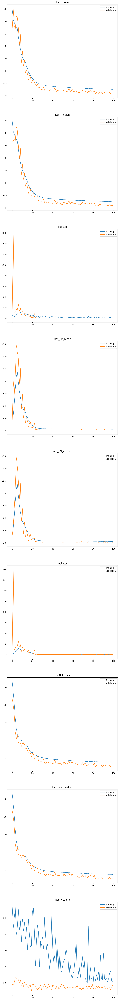

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.test()

 24%|██▍       | 48/196 [00:22<01:08,  2.18it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [01:32<00:00,  2.11it/s]


{'loss_mean': -3.688607692718506,
 'loss_median': -3.701589822769165,
 'loss_std': 0.083173006772995,
 'loss_FM_mean': 0.10610946267843246,
 'loss_FM_median': 0.0892975702881813,
 'loss_FM_std': 0.053468506783246994,
 'loss_NLL_mean': -7.483325481414795,
 'loss_NLL_median': -7.503546714782715,
 'loss_NLL_std': 0.14383238554000854}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_var =  (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()


                with pyro.plate("beta_plate", x.shape[1]):
                        beta = pyro.sample("beta", dist.Gamma(concentration=alpha, rate=1/beta_var))
                
                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                #print(f"beta: {beta.shape}")
                #print(f"x: {x.shape}")
                #print(f"mean: {mean.shape}")
                #print(f"sigma_squared: {sigma_squared.shape}")

                with pyro.plate("data", 

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

torch.Size([250000, 10])
The save path /content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/PFN_Experiments_CFM_InvGammaGammPrior_LearnedBaseDist_plus_nll_v1 does not exist, creating it


In [42]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:19, 10.50s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:16, 10.58s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:31<16:56, 10.48s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:41<16:45, 10.47s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:52<16:44, 10.57s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:03<16:32, 10.56s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:13<16:20, 10.54s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:24<16:15, 10.61s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:34<16:01, 10.56s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:45<15:48, 10.53s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:55<15:37, 10.54s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:06<15:31, 10.58s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:17<15:18, 10.55s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:27<15:06, 10.55s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:38<15:00, 10.60s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:48<14:44, 10.53s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:59<14:32, 10.52s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:09<14:27, 10.58s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:20<14:12, 10.53s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:30<13:59, 10.50s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:41<13:53, 10.55s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:51<13:38, 10.50s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:02<13:25, 10.46s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:12<13:19, 10.52s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:23<13:06, 10.48s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:33<12:54, 10.47s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:44<12:49, 10.54s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:54<12:35, 10.50s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:05<12:23, 10.47s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:15<12:17, 10.53s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:26<12:03, 10.49s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:36<11:50, 10.45s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:47<11:45, 10.53s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:57<11:33, 10.50s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:08<11:21, 10.48s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:18<11:09, 10.46s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:29<11:03, 10.53s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:39<10:50, 10.50s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:50<10:39, 10.48s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:00<10:32, 10.54s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:11<10:19, 10.50s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:21<10:11, 10.55s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:32<09:58, 10.51s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:42<09:46, 10.46s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:53<09:33, 10.43s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:03<09:26, 10.50s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:14<09:16, 10.49s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:24<09:03, 10.46s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:35<08:56, 10.52s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:45<08:43, 10.47s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:56<08:31, 10.45s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:06<08:25, 10.54s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:17<08:14, 10.52s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:27<08:01, 10.48s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:38<07:55, 10.56s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:48<07:42, 10.51s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:59<07:30, 10.47s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:09<07:20, 10.48s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:20<07:11, 10.53s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:30<06:59, 10.48s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:41<06:47, 10.45s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:51<06:39, 10.51s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:02<06:27, 10.47s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:12<06:16, 10.45s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:23<06:07, 10.50s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:33<05:55, 10.47s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:43<05:44, 10.44s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:54<05:36, 10.52s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:04<05:25, 10.49s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:15<05:14, 10.48s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:26<05:05, 10.53s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:36<04:53, 10.49s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:46<04:42, 10.48s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [12:57<04:31, 10.46s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:08<04:23, 10.53s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:18<04:12, 10.52s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:28<04:01, 10.50s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [13:39<03:52, 10.55s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:50<03:40, 10.51s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:00<03:29, 10.49s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:11<03:20, 10.54s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:21<03:09, 10.54s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:32<02:58, 10.51s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:42<02:49, 10.59s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [14:53<02:38, 10.54s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:03<02:26, 10.50s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:14<02:17, 10.56s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:24<02:06, 10.52s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [15:35<01:55, 10.48s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [15:45<01:45, 10.54s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [15:56<01:34, 10.50s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:06<01:23, 10.47s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:17<01:13, 10.53s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:27<01:03, 10.51s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [16:38<00:52, 10.48s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [16:49<00:42, 10.56s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [16:59<00:31, 10.52s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:09<00:20, 10.49s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:20<00:10, 10.49s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<20:46, 12.59s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:45, 12.71s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:37<20:22, 12.60s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:10, 12.61s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:03<20:02, 12.66s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:15<19:46, 12.62s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:28<19:43, 12.72s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:41<19:39, 12.82s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:54<19:18, 12.73s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:06<19:01, 12.68s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:19<18:52, 12.73s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:32<18:35, 12.67s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:44<18:16, 12.60s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:57<18:14, 12.72s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:10<17:52, 12.62s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:22<17:37, 12.58s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:35<17:33, 12.69s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:48<17:17, 12.66s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:00<17:04, 12.64s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:13<16:53, 12.67s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:25<16:34, 12.58s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:38<16:16, 12.52s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:50<16:08, 12.57s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:03<15:55, 12.57s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:16<15:46, 12.62s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:29<15:40, 12.71s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:41<15:22, 12.64s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:54<15:13, 12.69s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:06<14:53, 12.59s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:19<14:40, 12.58s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:32<14:39, 12.75s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:44<14:21, 12.67s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:57<14:09, 12.69s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:10<14:01, 12.75s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:23<13:45, 12.70s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:35<13:28, 12.63s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:48<13:20, 12.70s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:01<13:07, 12.71s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:13<12:52, 12.67s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:26<12:46, 12.77s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:39<12:28, 12.69s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:51<12:15, 12.68s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:04<12:09, 12.79s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:17<11:51, 12.70s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:30<11:37, 12.69s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:43<11:29, 12.76s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:55<11:09, 12.64s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:07<10:53, 12.57s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:20<10:49, 12.74s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:33<10:33, 12.66s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:46<10:20, 12.67s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [10:58<10:09, 12.69s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:11<09:54, 12.65s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:24<09:44, 12.71s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:36<09:29, 12.66s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:49<09:14, 12.60s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:01<09:00, 12.58s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:14<08:50, 12.62s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:27<08:36, 12.60s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:39<08:25, 12.63s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [12:52<08:11, 12.60s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:04<07:58, 12.59s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:17<07:48, 12.66s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:30<07:32, 12.56s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:42<07:19, 12.54s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [13:55<07:08, 12.59s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:08<06:59, 12.71s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:20<06:44, 12.64s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:33<06:34, 12.71s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:46<06:21, 12.73s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [14:58<06:07, 12.68s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:11<05:55, 12.71s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:24<05:42, 12.68s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:36<05:27, 12.61s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:49<05:17, 12.69s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:02<05:02, 12.62s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:14<04:49, 12.61s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:27<04:39, 12.70s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:39<04:24, 12.61s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [16:52<04:11, 12.59s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:05<03:59, 12.63s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:17<03:46, 12.60s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:30<03:35, 12.68s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:43<03:22, 12.64s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [17:55<03:09, 12.66s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:08<02:58, 12.72s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:21<02:44, 12.66s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:33<02:32, 12.68s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:46<02:19, 12.72s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [18:59<02:06, 12.66s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:11<01:53, 12.66s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:24<01:41, 12.64s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:37<01:28, 12.66s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [19:50<01:16, 12.70s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:02<01:03, 12.72s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:15<00:50, 12.65s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:27<00:37, 12.63s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:40<00:25, 12.66s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [20:53<00:12, 12.65s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:36,  9.46s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:18<15:18,  9.37s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:27<15:01,  9.29s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:37<14:48,  9.25s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:46<14:45,  9.32s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:55<14:32,  9.28s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:04<14:19,  9.24s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:14<14:17,  9.32s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:23<14:04,  9.28s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:32<13:52,  9.25s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:42<13:48,  9.31s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:51<13:35,  9.27s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:00<13:23,  9.23s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:09<13:11,  9.21s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:19<13:08,  9.28s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:28<12:55,  9.23s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:37<12:44,  9.21s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:46<12:41,  9.29s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [02:56<12:29,  9.26s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:05<12:18,  9.24s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:14<12:07,  9.21s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:23<12:05,  9.30s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:33<11:51,  9.25s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:42<11:40,  9.22s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:51<11:36,  9.29s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:00<11:25,  9.26s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:10<11:13,  9.22s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:19<11:09,  9.30s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:28<10:57,  9.26s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:37<10:46,  9.23s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:47<10:35,  9.21s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [04:56<10:31,  9.28s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:05<10:20,  9.26s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:14<10:09,  9.23s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:24<10:04,  9.30s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:33<09:53,  9.28s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:42<09:43,  9.27s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [05:52<09:37,  9.32s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:01<09:27,  9.30s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:10<09:16,  9.27s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:19<09:07,  9.28s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:29<09:02,  9.36s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:38<08:49,  9.30s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [06:47<08:38,  9.26s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [06:57<08:32,  9.31s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:06<08:20,  9.26s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:15<08:10,  9.25s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:25<08:05,  9.33s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:34<07:53,  9.28s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:43<07:42,  9.26s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [07:52<07:33,  9.26s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:02<07:26,  9.31s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:11<07:15,  9.28s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:20<07:05,  9.25s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:30<06:59,  9.31s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:39<06:48,  9.27s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [08:48<06:38,  9.26s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [08:58<06:32,  9.35s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:07<06:22,  9.32s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:16<06:11,  9.30s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:25<06:01,  9.28s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:35<05:54,  9.34s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [09:44<05:43,  9.28s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [09:53<05:33,  9.27s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:03<05:26,  9.33s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:12<05:15,  9.29s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:21<05:05,  9.27s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:30<04:57,  9.29s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:40<04:49,  9.34s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [10:49<04:38,  9.30s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [10:58<04:28,  9.26s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:08<04:21,  9.32s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:17<04:10,  9.28s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:26<04:00,  9.25s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:35<03:51,  9.24s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [11:45<03:43,  9.31s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [11:54<03:33,  9.27s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:03<03:23,  9.23s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:13<03:15,  9.32s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:22<03:05,  9.26s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:31<02:56,  9.26s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [12:40<02:46,  9.23s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [12:50<02:38,  9.30s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [12:59<02:28,  9.28s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:08<02:18,  9.25s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:17<02:10,  9.32s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:27<02:00,  9.28s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [13:36<01:51,  9.28s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [13:45<01:41,  9.24s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [13:55<01:33,  9.30s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:04<01:23,  9.27s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:13<01:14,  9.26s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:22<01:05,  9.32s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:32<00:55,  9.29s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [14:41<00:46,  9.26s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [14:50<00:36,  9.25s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [14:59<00:27,  9.31s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:09<00:18,  9.28s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:18<00:09,  9.23s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<22:49, 13.83s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:27<22:27, 13.75s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:41<22:24, 13.86s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:55<22:04, 13.80s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:09<22:00, 13.90s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:23<21:42, 13.86s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:37<21:35, 13.93s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:50<21:17, 13.89s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:04<20:59, 13.85s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:18<20:53, 13.92s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:32<20:34, 13.87s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:46<20:24, 13.92s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:00<20:07, 13.87s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:14<19:58, 13.93s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:28<19:41, 13.90s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:41<19:23, 13.85s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:56<19:15, 13.92s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:09<18:57, 13.87s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:23<18:50, 13.95s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:37<18:31, 13.89s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:51<18:13, 13.85s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:05<18:03, 13.90s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:19<17:47, 13.86s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:33<17:39, 13.93s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:47<17:21, 13.89s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:01<17:10, 13.93s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:15<16:55, 13.91s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:29<16:43, 13.94s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:42<16:25, 13.88s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:56<16:15, 13.94s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:10<15:57, 13.88s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:24<15:42, 13.86s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:38<15:32, 13.91s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:52<15:15, 13.87s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:06<15:05, 13.93s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:20<14:50, 13.91s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:33<14:33, 13.86s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:47<14:22, 13.91s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:01<14:04, 13.85s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:15<13:54, 13.90s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:29<13:39, 13.88s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:43<13:27, 13.93s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:57<13:09, 13.85s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:11<13:00, 13.94s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:25<12:45, 13.92s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:38<12:29, 13.87s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:53<12:19, 13.95s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:06<12:02, 13.89s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:20<11:50, 13.93s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:34<11:35, 13.91s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:48<11:19, 13.87s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:02<11:07, 13.91s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:16<10:53, 13.89s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:30<10:41, 13.96s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:44<10:25, 13.91s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:58<10:14, 13.96s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:12<09:58, 13.91s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:26<09:47, 13.98s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:40<09:31, 13.93s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [13:53<09:15, 13.89s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:07<09:03, 13.94s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:21<08:47, 13.88s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:35<08:35, 13.94s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [14:49<08:20, 13.89s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:03<08:07, 13.94s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:17<07:51, 13.88s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:31<07:40, 13.95s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [15:45<07:24, 13.90s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [15:58<07:09, 13.84s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:12<06:56, 13.89s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:26<06:41, 13.85s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:40<06:30, 13.93s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [16:54<06:14, 13.89s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:08<06:02, 13.93s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:22<05:46, 13.88s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:36<05:32, 13.86s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [17:50<05:20, 13.91s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:04<05:05, 13.88s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:18<04:52, 13.93s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:31<04:37, 13.87s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [18:45<04:24, 13.93s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [18:59<04:09, 13.88s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:13<03:55, 13.86s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:27<03:42, 13.93s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [19:41<03:28, 13.90s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [19:55<03:15, 13.95s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:09<03:00, 13.89s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:23<02:47, 13.95s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [20:37<02:33, 13.91s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [20:50<02:18, 13.87s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:04<02:05, 13.93s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:18<01:51, 13.89s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [21:32<01:37, 13.93s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [21:46<01:23, 13.90s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:00<01:09, 13.99s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:14<00:55, 13.94s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:28<00:41, 13.99s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [22:42<00:27, 13.92s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [22:56<00:13, 13.89s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<26:46, 16.22s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:34, 16.27s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:48<26:07, 16.16s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:04<26:01, 16.26s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:20<25:36, 16.17s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:37<25:26, 16.23s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:53<25:05, 16.19s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:09<24:54, 16.25s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:26<24:46, 16.34s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:42<24:20, 16.22s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:58<24:05, 16.24s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:14<23:44, 16.19s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:30<23:30, 16.21s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:46<23:10, 16.17s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:03<23:08, 16.34s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:19<22:43, 16.23s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:36<22:33, 16.31s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:52<22:15, 16.28s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:08<22:01, 16.31s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:24<21:36, 16.21s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:41<21:25, 16.27s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:57<21:09, 16.28s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:13<20:57, 16.33s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:29<20:33, 16.24s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:46<20:24, 16.32s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:02<20:01, 16.24s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:18<19:47, 16.27s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:35<19:30, 16.26s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:51<19:27, 16.45s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:08<19:03, 16.33s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:24<18:48, 16.35s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:40<18:28, 16.31s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:57<18:15, 16.34s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:13<17:53, 16.27s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:29<17:43, 16.37s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:46<17:27, 16.36s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:02<17:13, 16.40s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:18<16:49, 16.28s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:35<16:36, 16.33s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:51<16:14, 16.24s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:07<16:00, 16.29s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:23<15:42, 16.25s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:40<15:29, 16.31s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [11:56<15:08, 16.22s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:12<14:55, 16.29s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:29<14:44, 16.38s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:45<14:22, 16.28s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:01<14:09, 16.34s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:17<13:50, 16.29s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:34<13:33, 16.27s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:50<13:14, 16.21s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:06<13:03, 16.33s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:23<12:49, 16.38s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:39<12:33, 16.38s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [14:55<12:12, 16.28s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:12<12:04, 16.47s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:28<11:40, 16.30s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:44<11:25, 16.31s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:00<11:05, 16.23s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:17<10:52, 16.32s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:33<10:35, 16.30s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [16:50<10:20, 16.32s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:06<10:05, 16.36s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:22<09:50, 16.40s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:38<09:29, 16.27s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [17:55<09:16, 16.37s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:11<08:56, 16.26s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:27<08:41, 16.29s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:44<08:26, 16.33s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:00<08:12, 16.41s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:16<07:52, 16.30s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:33<07:37, 16.33s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [19:49<07:20, 16.33s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:06<07:04, 16.33s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:22<06:46, 16.25s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:38<06:29, 16.22s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [20:54<06:14, 16.28s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:11<05:58, 16.30s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:27<05:43, 16.34s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:43<05:26, 16.30s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [21:59<05:09, 16.27s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:16<04:53, 16.29s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:32<04:37, 16.33s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [22:48<04:21, 16.34s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:05<04:05, 16.36s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:21<03:47, 16.24s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:37<03:32, 16.34s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [23:53<03:14, 16.21s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:10<02:59, 16.33s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:26<02:43, 16.34s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:43<02:27, 16.38s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [24:59<02:10, 16.26s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:15<01:54, 16.32s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:31<01:37, 16.29s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [25:48<01:21, 16.29s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:04<01:04, 16.19s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:20<00:48, 16.30s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:37<00:32, 16.34s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [26:53<00:16, 16.25s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 507.88it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [05:30<00:00,  3.31s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,18.319021,0.056827,0.51915,6.226391,0.120377,0.113287,0.003529,0.000041,0.037437,4.616964,0.057255,0.052618
1,full_model_no_FM,gt,18.317062,0.056825,0.51490,6.251352,0.119196,0.112802,0.003603,0.000046,0.034363,4.737124,0.057535,0.053992
2,Variational Inference with guide: AutoDiagonal...,gt,18.309056,0.056841,0.54615,-11.344556,0.150245,0.148872,0.001741,0.000029,0.034552,23.175201,0.129839,0.129738
3,Variational Inference with guide: AutoMultivar...,gt,18.308060,0.056830,0.56385,0.114748,0.142992,0.143721,0.002680,0.000042,0.035426,14.761315,0.099769,0.098446
4,Variational Inference with guide: AutoLaplaceA...,gt,18.306768,0.056868,0.61095,NaN,NaN,0.111827,0.000000,0.000000,0.029616,NaN,NaN,0.056792
5,Variational Inference with guide: AutoIAFNorma...,gt,18.313269,0.056916,0.56575,-285.245228,0.181212,0.180107,0.007568,0.000089,0.030045,1918.741823,0.134866,0.137245
6,Variational Inference with guide: AutoStructur...,gt,18.312642,0.056877,0.54615,1.599071,0.143203,0.143132,0.002649,0.000033,0.033028,12.264420,0.095214,0.094872
7,Hamiltonian Monte Carlo,gt,18.319553,0.056899,0.50240,8.712730,0.111006,0.104548,0.002423,0.000041,0.031992,5.487698,0.063034,0.054578


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,2.017388e-04,6.673443e-01,5.916577e-01,7.622156e-01,7.465419e-01,8.204786e-01
1,full_model,Variational Inference with guide: AutoDiagonal...,3.896560e-18,1.110958e-02,2.111851e-07,1.110519e-14,5.289503e-02,1.063051e-03
2,full_model,Variational Inference with guide: AutoMultivar...,4.139141e-18,8.419306e-01,5.701804e-12,1.533408e-04,1.878794e-01,2.072981e-04
3,full_model,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,2.960545e-13,9.288727e-18,NaN,NaN,3.120798e-01
4,full_model,Variational Inference with guide: AutoIAFNorma...,4.924583e-13,3.893182e-15,2.080598e-11,5.796713e-10,1.103653e-07,1.519836e-11
5,full_model,Variational Inference with guide: AutoStructur...,1.167642e-16,1.479087e-13,8.448410e-07,6.267117e-03,2.341799e-01,1.171299e-03
6,full_model,Hamiltonian Monte Carlo,1.338438e-01,1.608105e-15,3.661142e-04,7.372353e-13,5.295578e-03,1.700126e-06
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,4.396866e-18,2.149562e-03,1.136801e-08,6.283587e-15,3.476101e-02,3.776516e-04
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,3.896560e-18,4.063340e-01,1.937875e-13,1.051326e-04,1.218039e-01,1.554750e-04
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.258412e-12,7.470087e-18,NaN,NaN,4.034290e-01



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model,full_model_no_FM,0.285118,0.058462,0.603310,0.095496,0.094361,0.083474
1,full_model,Variational Inference with guide: AutoDiagonal...,0.597189,1.532001,0.980155,0.606420,1.010475,0.014593
2,full_model,Variational Inference with guide: AutoMultivar...,0.564253,1.063710,0.956620,0.463724,1.036034,0.031727
3,full_model,Variational Inference with guide: AutoLaplaceA...,0.520722,2.467404,1.000000,0.198547,0.306526,0.000000
4,full_model,Variational Inference with guide: AutoIAFNorma...,0.741359,1.325728,0.958395,0.661469,1.221912,0.037463
5,full_model,Variational Inference with guide: AutoStructur...,0.532684,0.978736,0.950840,0.437210,1.047357,0.032782
6,full_model,Hamiltonian Monte Carlo,0.328933,0.291072,0.911265,0.123395,0.264950,0.043422
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.588404,1.462880,0.977990,0.605816,1.009804,0.014057
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.553038,0.987286,0.948470,0.467918,1.043433,0.034121
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.513117,2.383753,1.000000,0.201424,0.262821,0.000000


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,1.233215e-14,2.803737e-34,2.551054e-34
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoMultivar...,7.998107e-11,8.772672e-33,4.133518e-34
2,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoLaplaceA...,1.410301e-22,2.562144e-34,5.637528e-39
3,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoIAFNorma...,5.113143e-18,5.814230e-33,4.916714e-34
4,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoStructur...,3.591084e-09,1.719949e-32,4.803880e-34
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,2.450362e-02,5.052513e-13,6.298415e-34
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,4.899589e-03,9.541477e-22,8.138234e-38
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,3.462303e-01,3.837169e-01,7.133952e-04
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,9.343932e-04,1.136970e-04,2.082101e-01


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          18.319021            0.056827   
  1                                          18.317062            0.056825   
  2                                          18.309056            0.056841   
  3                                          18.308060            0.056830   
  4    

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

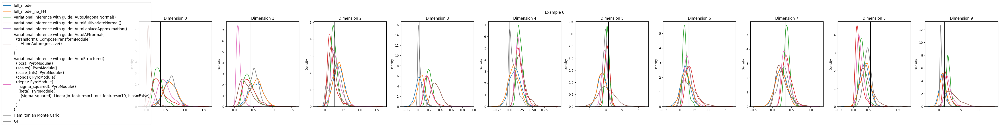

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

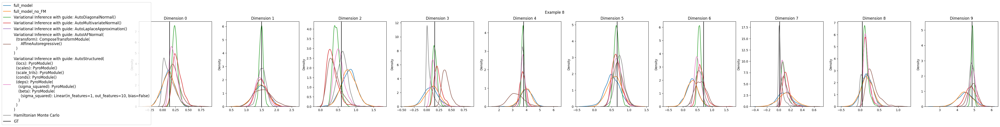

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

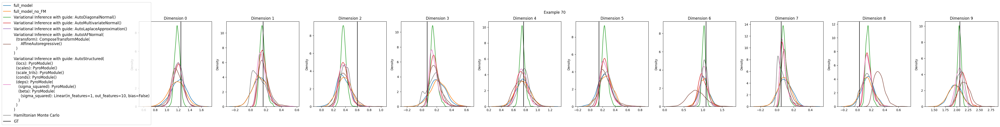

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

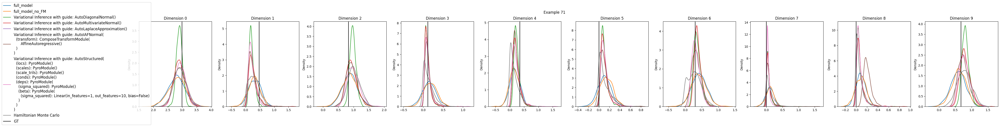

/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:75: UserWarning: Dataset has 

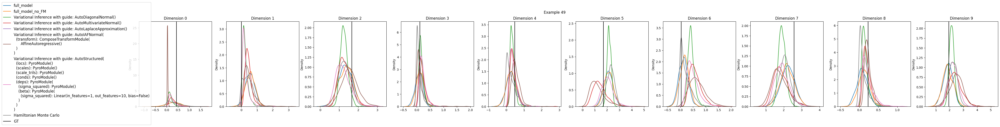

In [43]:
evaluation.plot_results()